In [22]:
# Automatic reloading of imports
%load_ext autoreload
%autoreload 2
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits

# pyodine path on the machine
pyodine_path = '/Users/jaklusmeyer/SONG/pyodine'
data_path = '/Users/jaklusmeyer/SONG/reduce/'


sys.path.append(pyodine_path)
if not hasattr(np, 'float'):
    np.float = float
if not hasattr(np, 'int'):
    np.int = int
if not hasattr(np, 'bool'):
    np.bool = bool
if not hasattr(np, 'object'):
    np.object = object
if not hasattr(np, 'long'):
    np.long = int  # Python 3 doesn't have 'long'
import pyodine

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [23]:
sys.path.append(pyodine_path)

import pyodine_create_templates 

# we are using APO SONG

import utilities_song_apo as utilities
from utilities_song_apo import load_pyodine
import inspect

conf = load_pyodine.conf  # Now you pull `conf` from inside the loaded module

print("Using conf.py from:", inspect.getfile(conf))
print("Instruments defined:", list(conf.my_instruments.keys()))
Pars = utilities.pyodine_parameters.Template_Parameters()
vars(Pars)
Pars = utilities.pyodine_parameters.Template_Parameters()
print(vars(Pars))

Using conf.py from: /Users/jaklusmeyer/SONG/pyodine/utilities_song_apo/conf.py
Instruments defined: ['song_1', 'song_2', 'lick', 'waltz', 'song_3']
{'osample_obs': 6, 'lsf_conv_width': 6.0, 'log_config_file': '/Users/jaklusmeyer/SONG/pyodine/utilities_song_apo/logging.json', 'log_level': 20, 'use_progressbar': True, 'telluric_mask': None, 'tell_wave_range': (None, 6500), 'tell_dispersion': 0.002, 'chunking_algorithm': 'auto_equal_width', 'temp_order_range': (22, 47), 'chunk_width': 130, 'chunk_padding': 20, 'chunks_per_order': 25, 'pix_offset0': 15, 'wavelength_dict': {'start_wave': [], 'end_wave': []}, 'ref_spectrum': 'arcturus', 'velgues_order_range': (6, 20), 'delta_v': 1000.0, 'maxlag': 500, 'velocity_override': -26400.0, 'normalize_chunks': False, 'bad_pixel_mask': False, 'bad_pixel_cutoff': 0.22, 'correct_obs': False, 'weight_type': 'flat', 'rel_noise': 0.008, 'i2_to_use': 3, 'wavelength_scale': 'air', 'jansson_run_model': 1, 'chunk_weights_redchi': False, 'deconvolution_pars': {

In [24]:
iod1 = utilities.load_pyodine.IodineTemplate(1)#song
iod2 = utilities.load_pyodine.IodineTemplate(2)#Fisher
iod3 = utilities.load_pyodine.IodineTemplate(3)#apo
iod4 = utilities.load_pyodine.IodineTemplate(4)#newapo


Reversing iodine template wavelength array to ensure increasing order.


Reversing iodine template wavelength array to ensure increasing order.


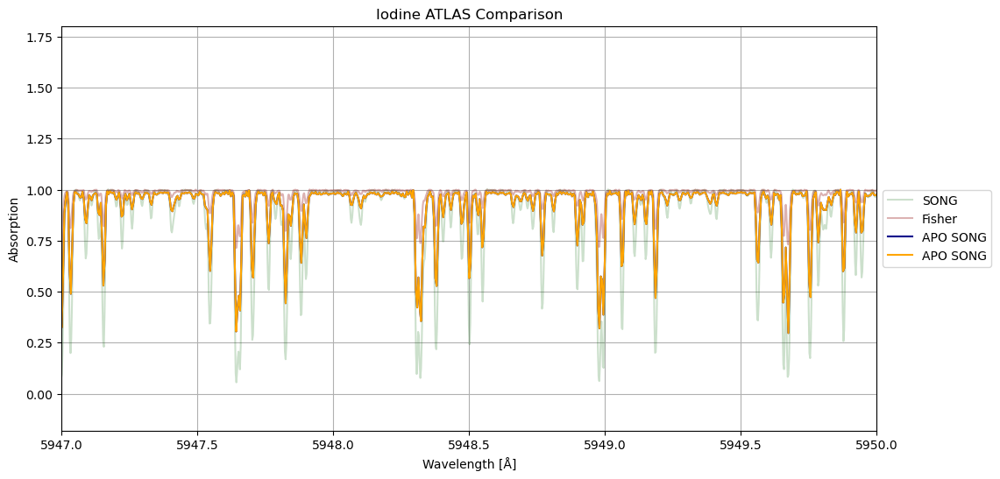

SONG Iodine min/max wavelength: 4988.607249459516 6498.199513520377
Fisher Iodine min/max wavelength: 4978.618791762656 6248.265379308419
APO SONG Iodine min/max wavelength: 4979.9946070376855 6499.989276739749


In [25]:
iod = utilities.load_pyodine.IodineTemplate(Pars.i2_to_use)
#plot the iodine template
plt.figure(figsize=(12,6))
plt.plot(iod1.wave, iod1.flux, color='darkgreen', alpha=0.2, label='SONG')
plt.plot(iod2.wave, iod2.flux, color='darkred', alpha=0.3, label='Fisher')
plt.plot(iod3.wave, iod3.flux, color='darkblue', label='APO SONG')
plt.plot(iod3.wave, iod3.flux, color='orange', label='APO SONG')

plt.title("Iodine ATLAS Comparison") 
plt.xlabel("Wavelength [Å]")
#legend on right side of plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.xlim(5947,5950)
plt.ylabel("Absorption")
plt.show()
print#min max wavelengths
print("SONG Iodine min/max wavelength:", iod1.wave.min(), iod1.wave.max())
print("Fisher Iodine min/max wavelength:", iod2.wave.min(), iod2.wave.max())
print("APO SONG Iodine min/max wavelength:", iod3.wave.min(), iod3.wave.max())

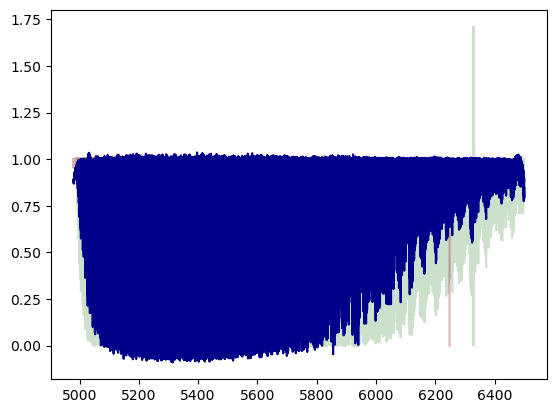

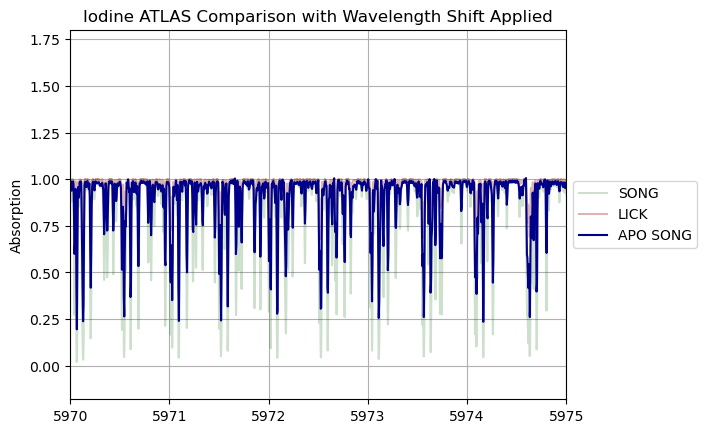

In [26]:
plt.plot(iod1.wave, iod1.flux, color='darkgreen', alpha=0.2, label='SONG')
plt.plot(iod2.wave, iod2.flux, color='darkred', alpha=0.3, label='LICK')
plt.plot(iod.wave, iod.flux, color='darkblue', label='APO SONG')
plt.show()

wave = iod.wave
flux = iod.flux
mask_region = (wave > 5943) & (wave < 5945)
mask_region_song = (iod1.wave > 5943) & (iod1.wave < 5945)
wave_apoh5 = wave[mask_region]
flux_apoh5 = flux[mask_region]
wave_song = iod1.wave[mask_region_song]
flux_song = iod1.flux[mask_region_song]

# Interpolate both onto a common grid
common_wave = np.linspace(5943, 5945, 5000)
from scipy.interpolate import interp1d
f1 = interp1d(wave_apoh5, flux_apoh5, kind='linear', bounds_error=False, fill_value=1.0)
f2 = interp1d(wave_song, flux_song, kind='linear', bounds_error=False, fill_value=1.0)

flux1 = f1(common_wave)
flux2 = f2(common_wave)

# Normalize for cross-correlation
flux1 -= np.mean(flux1)
flux2 -= np.mean(flux2)

# Cross-correlation
from scipy.signal import correlate
corr = correlate(flux1, flux2, mode='full')
lags = np.arange(-len(flux1) + 1, len(flux2))
best_lag = lags[np.argmax(corr)]
delta_wave_zoom = best_lag * (common_wave[1] - common_wave[0])

delta_wave_zoom
#fix for wavelength offset
plt.plot(iod1.wave, iod1.flux, color='darkgreen', alpha=0.2, label='SONG')
plt.plot(iod2.wave, iod2.flux, color='darkred', alpha=0.3, label='LICK')
plt.plot(iod.wave-delta_wave_zoom, iod.flux, color='darkblue', label='APO SONG')
plt.title("Iodine ATLAS Comparison with Wavelength Shift Applied")
#legend on right side of plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.xlim(5970,5975)
plt.ylabel("Absorption")
plt.show()

In [27]:
print("Iodine flux contains NaNs:", np.isnan(iod.flux).any())
print("Iodine wave contains NaNs:", np.isnan(iod.wave).any())

Iodine flux contains NaNs: False
Iodine wave contains NaNs: False


#go here to input files!!!!!!!!!

In [28]:
# ====================================change these====================================================
night = "UT260321"

target_name = "HD185144"          # template star (sigdra)
ostar_name  = "HR3982"            # hot star (LSF)  
results_dir_name = "0007_sigdra_temp_results_v5_o01_idealnight"

ostar_subdir         = "ostar01"
templatestar_subdir  = "templatestar"
sciencestar_subdir   = "sciencestar"  


# ======================================== stay the same================================================
# Input paths
data_base_dir = os.path.abspath(data_path)
print("Data base directory:", data_base_dir)

night_dir = os.path.join(data_base_dir, night)

ostar_dir = os.path.join(night_dir, ostar_subdir)
temp_dir  = os.path.join(night_dir, templatestar_subdir)
science_dir = os.path.join(night_dir, sciencestar_subdir)
print("Ostar directory:", ostar_dir)
print("Template directory:", temp_dir)
print("Science direcotry: ", science_dir)


def get_fits_files(directory, label, expect_i2=None):
    if not os.path.isdir(directory):
        raise ValueError(f"{label} is not a directory: {directory}")

    fits_files = sorted(
        os.path.join(directory, f)
        for f in os.listdir(directory)
        if f.lower().endswith(".fits")
    )

    if len(fits_files) == 0:
        raise ValueError(f"No FITS files found in {label}: {directory}")

    if expect_i2 is not None:
        verified = []
        for fpath in fits_files:
            with fits.open(fpath) as hdul:
                h = hdul[0].header
                has_i2 = (h.get('FILTER', '') == 'iodine') or (h.get('I2POS', 0) > 0)
            if has_i2 == expect_i2:
                verified.append(fpath)
            else:
                print(f"  *** WRONG: {os.path.basename(fpath)} ***")
        fits_files = verified

    print(f"{label}: {len(fits_files)} file(s)")
    return fits_files


ostar_files = get_fits_files(ostar_dir, "Ostar directory")
temp_files  = get_fits_files(temp_dir, "Template directory")

# Output paths
plot_dir = os.path.join(data_base_dir, results_dir_name)
os.makedirs(plot_dir, exist_ok=True)

obs_sum_outname = os.path.join(
    plot_dir, "obs_temp_highsnr_test.fits"
)

temp_outname = os.path.join(
    plot_dir, "obs_temp_highsnr_test.h5"
)

print("Observation summary output:", obs_sum_outname)
print("Template output:", temp_outname)

res_files = [
    os.path.join(plot_dir, f"{target_name}_res0.h5"),
    os.path.join(plot_dir, f"{target_name}_res1.pkl"),
]

error_file = os.path.join(plot_dir, "error.log")
info_file  = os.path.join(plot_dir, "info.log")


ostar_files = get_fits_files(ostar_dir, "Ostar directory", expect_i2=True)
temp_files  = get_fits_files(temp_dir, "Template directory", expect_i2=False)

Data base directory: /Users/jaklusmeyer/SONG/reduce
Ostar directory: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01
Template directory: /Users/jaklusmeyer/SONG/reduce/UT260321/templatestar
Science direcotry:  /Users/jaklusmeyer/SONG/reduce/UT260321/sciencestar
Ostar directory: 3 file(s)
Template directory: 6 file(s)
Observation summary output: /Users/jaklusmeyer/SONG/reduce/0007_sigdra_temp_results_v5_o01_idealnight/obs_temp_highsnr_test.fits
Template output: /Users/jaklusmeyer/SONG/reduce/0007_sigdra_temp_results_v5_o01_idealnight/obs_temp_highsnr_test.h5
Ostar directory: 3 file(s)
Template directory: 6 file(s)


In [29]:
pars_dict = vars(Pars)  # get all attributes as a dictionary
lsf_setup = pars_dict['model_runs'][1]['lsf_setup_dict']  # navigate into the nested dictionary

print('positions:', lsf_setup['positions'])
print('sigmas:   ', lsf_setup['sigmas'])

positions: [-4.35, -3.75, -2.85, -2.1, -1.5, 0.0, 1.5, 2.1, 2.85, 3.75, 4.35]
sigmas:    [1.35, 1.35, 1.35, 1.35, 1.35, 0.9, 1.35, 1.35, 1.35, 1.35, 1.35]


Reversing iodine template wavelength array to ensure increasing order.
Using Iodine template index: 3


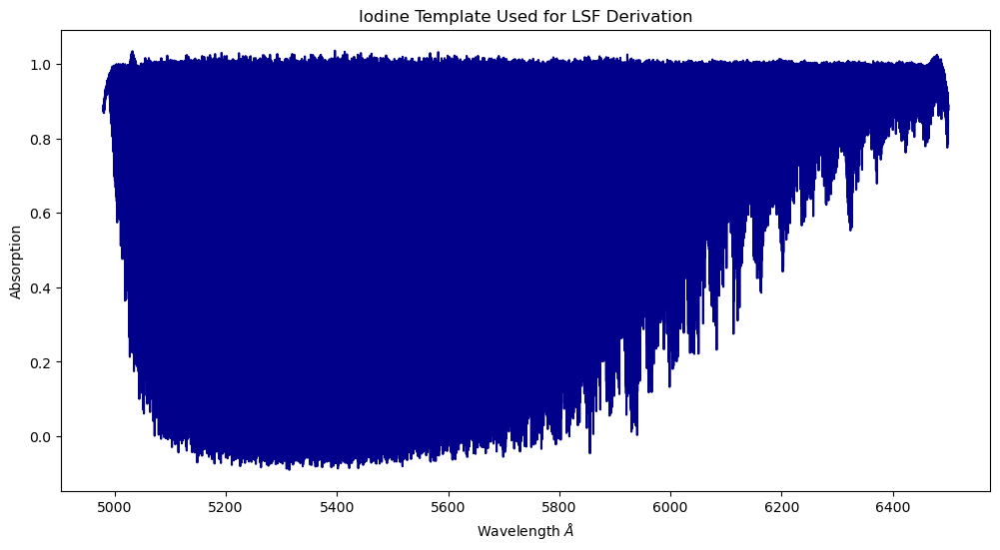

In [30]:
#verify it is the apo iodine template
iod1 = utilities.load_pyodine.IodineTemplate(Pars.i2_to_use)
print("Using Iodine template index:", Pars.i2_to_use)
plt.figure(figsize=(12,6))
plt.plot(iod.wave, iod.flux, color='darkblue')
plt.title("Iodine Template Used for LSF Derivation") 
plt.xlabel("Wavelength $\AA$")
plt.ylabel("Absorption")
plt.show()


In [31]:
pyodine_create_templates.create_template(utilities, Pars, ostar_files, temp_files, 
                                         temp_outname, plot_dir=plot_dir, res_files=res_files, 
                                         obs_sum_outname=obs_sum_outname, error_log=error_file, 
                                         info_log=info_file, quiet=False, live=False)



Branch: master
Hash: c2a71ac
---------------------------
Aiming to create template: /Users/jaklusmeyer/SONG/reduce/0007_sigdra_temp_results_v5_o01_idealnight/obs_temp_highsnr_test.h5
Trying to load file: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.0159.fits
Detected multi-extension FITS format
Reversing arrays to ensure ascending wavelength
BVC from header: -14.70 km/s
Instrument is SONG/APO SONG!!!
Trying to load file: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.0160.fits
Detected multi-extension FITS format
Reversing arrays to ensure ascending wavelength
BVC from header: -14.71 km/s
Instrument is SONG/APO SONG!!!
Trying to load file: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.0161.fits
Detected multi-extension FITS format
Reversing arrays to ensure ascending wavelength
BVC from header: -14.71 km/s
Instrument is SONG/APO SONG!!!

Hot star observations (3):
/Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.

100% (650 of 650) |######################| Elapsed Time: 0:00:09 Time:  0:00:09



Number of chunks with no uncertainties: 0
Number of chunks with outliers: 0
Number of chunks with nan fitted red. Chi2: 0

Creating analysis plots...

----------------------
RUN 1
----------------------

LSF setup dictionary:
{'positions': [-4.35, -3.75, -2.85, -2.1, -1.5, 0.0, 1.5, 2.1, 2.85, 3.75, 4.35], 'sigmas': [1.35, 1.35, 1.35, 1.35, 1.35, 0.9, 1.35, 1.35, 1.35, 1.35, 1.35]}

Constraining parameters for RUN 1

Fitted LSF parameters:
<ParameterSet (values: 10)>
    left_1  =  11.233036903617457
    left_2  =  -10.53379380077636
    left_3  =  5.969757900988643
    left_4  =  -2.189820879844051
    left_5  =  0.6767696072249542
    right1  =  11.23303919397806
    right2  =  -10.533798741777309
    right3  =  5.969762308013889
    right4  =  -2.189823696702069
    right5  =  0.6767706970896685


  0% (3 of 650) |                        | Elapsed Time: 0:00:00 ETA:   0:01:33

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  56333.409414954935
    cont_slope      =  75.62354232906762
    iod_depth       =  1.3620328907271597
    lsf_left_1      =  2.3024762526981495
    lsf_left_2      =  -17.066770516309376
    lsf_left_3      =  2.1190407291015214
    lsf_left_4      =  -0.7347328058478046
    lsf_left_5      =  0.13548916852979434
    lsf_right1      =  2.2494974753351267
    lsf_right2      =  -9.032036200572206
    lsf_right3      =  2.2644958866438545
    lsf_right4      =  -1.4232057502981905
    lsf_right5      =  0.38492711850205974
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  4997.881202771211
    wave_slope      =  0.016386459546045284
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan

  1% (8 of 650) |                        | Elapsed Time: 0:00:00 ETA:   0:01:13

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  93746.47600635988
    cont_slope      =  57.824784525431994
    iod_depth       =  1.1069750467086785
    lsf_left_1      =  6.995450930877736
    lsf_left_2      =  -18.698464121515766
    lsf_left_3      =  1.9337164816437205
    lsf_left_4      =  -1.5344602309940951
    lsf_left_5      =  0.9969003514330722
    lsf_right1      =  3.1026026294598226
    lsf_right2      =  -18.624087904224886
    lsf_right3      =  5.7722912077441695
    lsf_right4      =  -3.6108868457430603
    lsf_right5      =  0.15018296989171526
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5007.7234425934375
    wave_slope      =  0.014666656579168777
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan

 16% (104 of 650) |###                   | Elapsed Time: 0:00:11 ETA:   0:00:59

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  72167.2691386593
    cont_slope      =  50.11819350620619
    iod_depth       =  1.0689864325017286
    lsf_left_1      =  4.232992160399373
    lsf_left_2      =  -13.155888315281477
    lsf_left_3      =  8.66772323090169
    lsf_left_4      =  -2.7366976812595936
    lsf_left_5      =  0.24316034266546288
    lsf_right1      =  3.4582926738190496
    lsf_right2      =  -18.910976390996705
    lsf_right3      =  2.4584140551291034
    lsf_right4      =  -2.852722074918142
    lsf_right5      =  1.1602136036108877
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5169.423185111683
    wave_slope      =  0.0158084235952989
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

 18% (118 of 650) |###                   | Elapsed Time: 0:00:12 ETA:   0:00:48

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  124353.23230247728
    cont_slope      =  -23.551181925323235
    iod_depth       =  0.9613142850926257
    lsf_left_1      =  2.278615705805828
    lsf_left_2      =  -17.06253064721407
    lsf_left_3      =  7.451118308478256
    lsf_left_4      =  -2.819047313474112
    lsf_left_5      =  0.4554464233490474
    lsf_right1      =  8.103069795490011
    lsf_right2      =  -18.835300699118967
    lsf_right3      =  7.694669812156169
    lsf_right4      =  -3.1644902859073687
    lsf_right5      =  0.5311009430295457
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5196.241157983679
    wave_slope      =  0.013711289911275733
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan

 21% (138 of 650) |####                  | Elapsed Time: 0:00:14 ETA:   0:01:04

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  147073.77319459827
    cont_slope      =  53.322420689133295
    iod_depth       =  1.001206998155588
    lsf_left_1      =  5.001619828101182
    lsf_left_2      =  -11.765519810871604
    lsf_left_3      =  1.9311145026905496
    lsf_left_4      =  -1.5466060311379168
    lsf_left_5      =  0.14558823883211697
    lsf_right1      =  2.317976725073851
    lsf_right2      =  -16.378127619654578
    lsf_right3      =  8.3633403011839
    lsf_right4      =  -2.9961655584595928
    lsf_right5      =  0.5362220014945771
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5231.436958568869
    wave_slope      =  0.014550587669161572
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan

 30% (197 of 650) |######                | Elapsed Time: 0:00:21 ETA:   0:00:43

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  124169.57391090774
    cont_slope      =  -72.10902781881312
    iod_depth       =  0.990056298487549
    lsf_left_1      =  2.4823387923711486
    lsf_left_2      =  -18.771069581492448
    lsf_left_3      =  1.8979540936205643
    lsf_left_4      =  -2.0049100756563076
    lsf_left_5      =  0.8573348011507973
    lsf_right1      =  4.223122460610259
    lsf_right2      =  -14.06497291394122
    lsf_right3      =  7.314703487841952
    lsf_right4      =  -3.1570681449705984
    lsf_right5      =  0.9018680618418644
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5338.954748196962
    wave_slope      =  0.01347776658597504
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan

 40% (265 of 650) |########              | Elapsed Time: 0:00:27 ETA:   0:00:38

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  161405.69948737836
    cont_slope      =  -64.5759091261647
    iod_depth       =  1.1443316920445186
    lsf_left_1      =  6.562227344098324
    lsf_left_2      =  -18.436480350543135
    lsf_left_3      =  7.589459615006493
    lsf_left_4      =  -2.1763006543683376
    lsf_left_5      =  0.14427779384880823
    lsf_right1      =  2.3068979352906456
    lsf_right2      =  -17.940488914205638
    lsf_right3      =  2.5978578363229055
    lsf_right4      =  -3.8233248533967368
    lsf_right5      =  0.13922661128671102
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5468.886732140444
    wave_slope      =  0.014888132724437257
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan


 44% (289 of 650) |#########             | Elapsed Time: 0:00:30 ETA:   0:00:43

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  160403.10137463865
    cont_slope      =  -9.571360692909497
    iod_depth       =  1.0588466942720947
    lsf_left_1      =  2.420835163274772
    lsf_left_2      =  -15.419602970207913
    lsf_left_3      =  4.63208425441548
    lsf_left_4      =  -2.890752510348949
    lsf_left_5      =  1.1711647972082213
    lsf_right1      =  2.329849421382554
    lsf_right2      =  -17.38382147450053
    lsf_right3      =  2.3516330264948
    lsf_right4      =  -2.487900709049624
    lsf_right5      =  1.1136143753509615
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5516.189465375531
    wave_slope      =  0.015164377341578139
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan 

 66% (432 of 650) |##############        | Elapsed Time: 0:00:42 ETA:   0:00:18

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  127155.99866497204
    cont_slope      =  50.75170154400809
    iod_depth       =  1.0963780806684422
    lsf_left_1      =  2.5890015471573258
    lsf_left_2      =  -18.117717538469684
    lsf_left_3      =  3.7160935757423346
    lsf_left_4      =  -1.6792518259749936
    lsf_left_5      =  0.6679548060733335
    lsf_right1      =  2.903663758017624
    lsf_right2      =  -15.633687804976486
    lsf_right3      =  8.319173704757677
    lsf_right4      =  -3.933271688394018
    lsf_right5      =  1.1639292371528258
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5816.279789824642
    wave_slope      =  0.017218006602122294
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 na

 67% (441 of 650) |##############        | Elapsed Time: 0:00:43 ETA:   0:00:22

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  168399.96171234068
    cont_slope      =  -20.068073220500935
    iod_depth       =  1.1320928650052775
    lsf_left_1      =  3.498478453479008
    lsf_left_2      =  -14.268961145950334
    lsf_left_3      =  10.589416908415187
    lsf_left_4      =  -3.671665270156441
    lsf_left_5      =  0.25235391830003334
    lsf_right1      =  2.3061695898165593
    lsf_right2      =  -18.280475021451686
    lsf_right3      =  1.2318056395866266
    lsf_right4      =  -0.734653943478798
    lsf_right5      =  0.18115204749389974
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  5835.520128266179
    wave_slope      =  0.015726396596138496
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan

 83% (545 of 650) |##################    | Elapsed Time: 0:00:51 ETA:   0:00:07

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  134412.7704581472
    cont_slope      =  -66.98446791682959
    iod_depth       =  0.98801514437777
    lsf_left_1      =  3.365572926385264
    lsf_left_2      =  -16.20007664720887
    lsf_left_3      =  2.391923611440599
    lsf_left_4      =  -1.0068116866621617
    lsf_left_5      =  0.45719458028336246
    lsf_right1      =  2.435286461096492
    lsf_right2      =  -17.30884679256791
    lsf_right3      =  10.643441401287856
    lsf_right4      =  -3.3747859256906407
    lsf_right5      =  0.4585736783027169
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  6074.94222958805
    wave_slope      =  0.015687935380995218
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan na

 99% (644 of 650) |##################### | Elapsed Time: 0:01:01 ETA:   0:00:00

NaN value detected in oversampled model function.
<ParameterSet (values: 17)>
    cont_intercept  =  131088.21924915304
    cont_slope      =  -45.897569421449575
    iod_depth       =  0.9191498491655767
    lsf_left_1      =  2.25219013164357
    lsf_left_2      =  -7.34391376409544
    lsf_left_3      =  2.062593764385346
    lsf_left_4      =  -3.890076746627909
    lsf_left_5      =  0.956632685159663
    lsf_right1      =  3.174083639395456
    lsf_right2      =  -18.018831707367465
    lsf_right3      =  9.118254531879412
    lsf_right4      =  -3.5270869079107245
    lsf_right5      =  0.13607835342996938
    tem_depth       =  1.0
    velocity        =  0.0
    wave_intercept  =  6323.320764294518
    wave_slope      =  0.016443611743490554
Evaluated LSF:
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan n

100% (650 of 650) |######################| Elapsed Time: 0:01:02 Time:  0:01:02



Number of chunks with no uncertainties: 0
Number of chunks with outliers: 0
Number of chunks with nan fitted red. Chi2: 13

Creating analysis plots...

----------------------
All runs done, continuing to template deconvolution...
Deconvolve: /Users/jaklusmeyer/SONG/reduce/UT260321/templatestar/HD185144_ec_260321.0244.fits
Deconvolving chunks...


100% (650 of 650) |######################| Elapsed Time: 0:03:18 Time:  0:03:18


Saving deconvolved template to /Users/jaklusmeyer/SONG/reduce/0007_sigdra_temp_results_v5_o01_idealnight/obs_temp_highsnr_test.h5

Done, full working time: 286.798770904541


Alright, let’s load the saved results and inspect them - first the results from the second (Multi-Gaussian) run. This is quite straight forward, as they were saved through the dill package, where the whole object structure is preserved and can easily be restored: https://pyodine.readthedocs.io/en/latest/tutorial/template/ 

In [32]:
fit_results_1 = pyodine.fitters.results_io.load_results(res_files[1], filetype='dill')

# Also construct the original chunks array of the O/B-star observations
chunks = pyodine.components.ChunkArray()
for r in fit_results_1:
    chunks.append(r.chunk)

In [33]:
print('Number of chunks/fit results:', len(fit_results_1))
print('\nObject structure of each fit result:')
print(fit_results_1[0].__dict__)

Number of chunks/fit results: 650

Object structure of each fit result:
{'chunk': <pyodine.components.Chunk object at 0x17e0c0fd0>, 'model': <pyodine.models.spectrum.SimpleModel object at 0x335d27250>, 'lmfit_result': <lmfit.minimizer.MinimizerResult object at 0x335d272e0>, 'chunk_ind': 0}


In [34]:
chunks, fit_results_0 = pyodine.fitters.results_io.restore_results_object(
    utilities, res_files[0])

Trying to load file: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.0159.fits
Detected multi-extension FITS format
Reversing arrays to ensure ascending wavelength
BVC from header: -14.70 km/s
Instrument is SONG/APO SONG!!!
Trying to load file: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.0160.fits
Detected multi-extension FITS format
Reversing arrays to ensure ascending wavelength
BVC from header: -14.71 km/s
Instrument is SONG/APO SONG!!!
Trying to load file: /Users/jaklusmeyer/SONG/reduce/UT260321/ostar01/HR3982_ec_260321.0161.fits
Detected multi-extension FITS format
Reversing arrays to ensure ascending wavelength
BVC from header: -14.71 km/s
Instrument is SONG/APO SONG!!!
Reversing iodine template wavelength array to ensure increasing order.
Total number of created chunks: 650 (in result file: 650)
Number of created chunks in order 0: 25


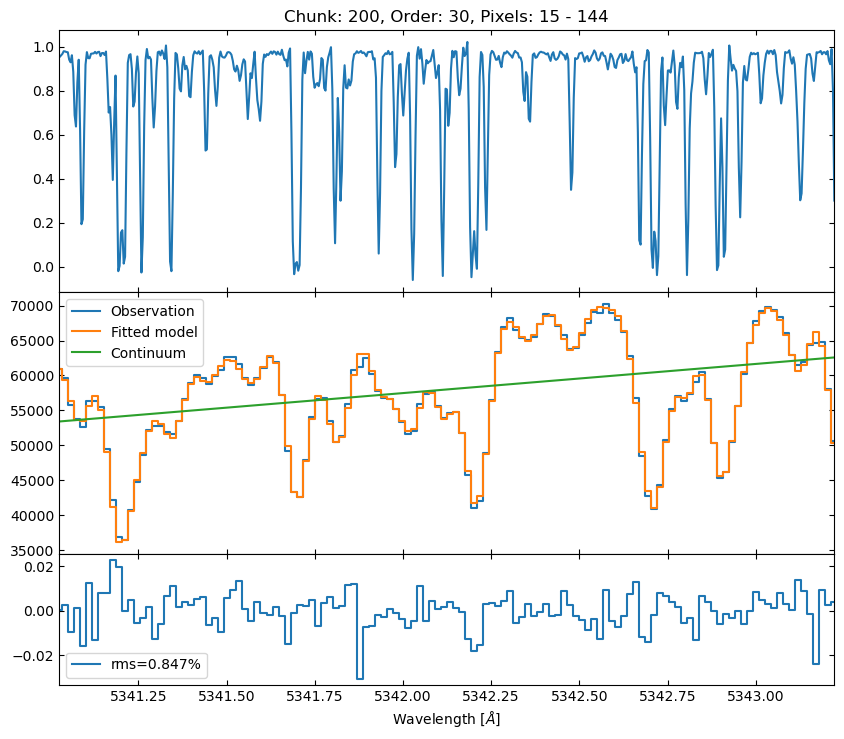

In [35]:
# Chunk index
chunk_ind = 200

pyodine.plot_lib.plot_chunkmodel(fit_results_1, chunks, chunk_ind, template=False, 
                                 show_plot=True)

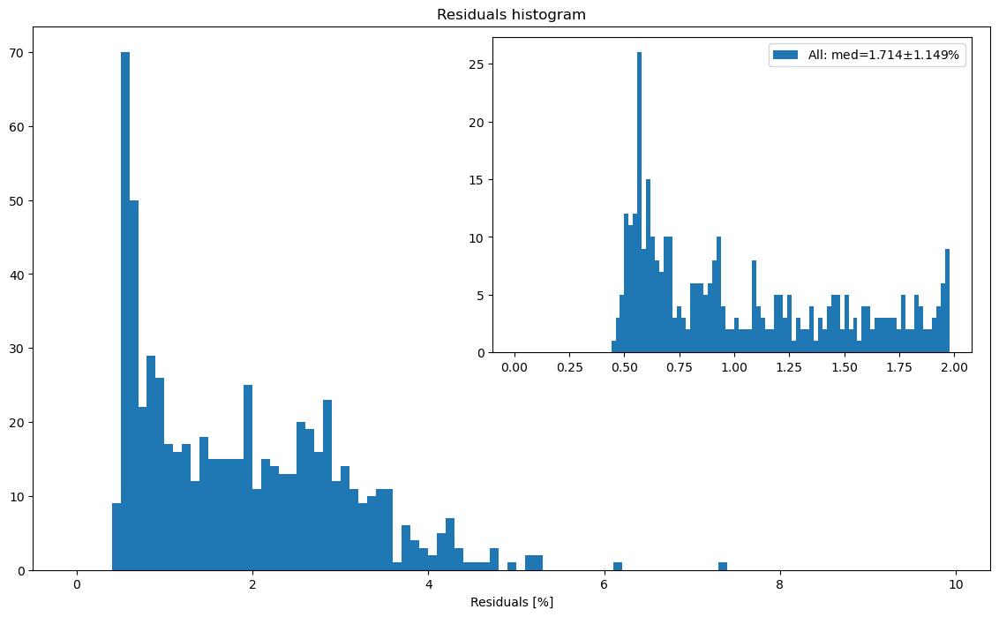

In [36]:
residuals = pyodine.plot_lib.plot_residual_hist(fit_results_1, title='Residuals histogram', 
                                                show_plot=True)

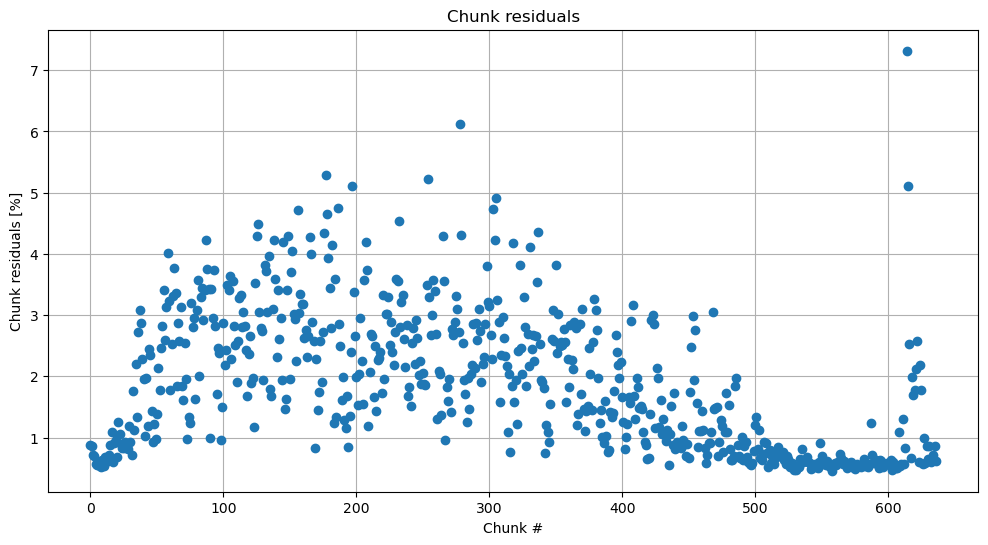

In [37]:
pyodine.plot_lib.plot_chunk_scatter(scatter=residuals, ylabel='Chunk residuals [%]', 
                                    title='Chunk residuals', show_plot=True)


Ostar extracted LSFs plotting:  HR3982


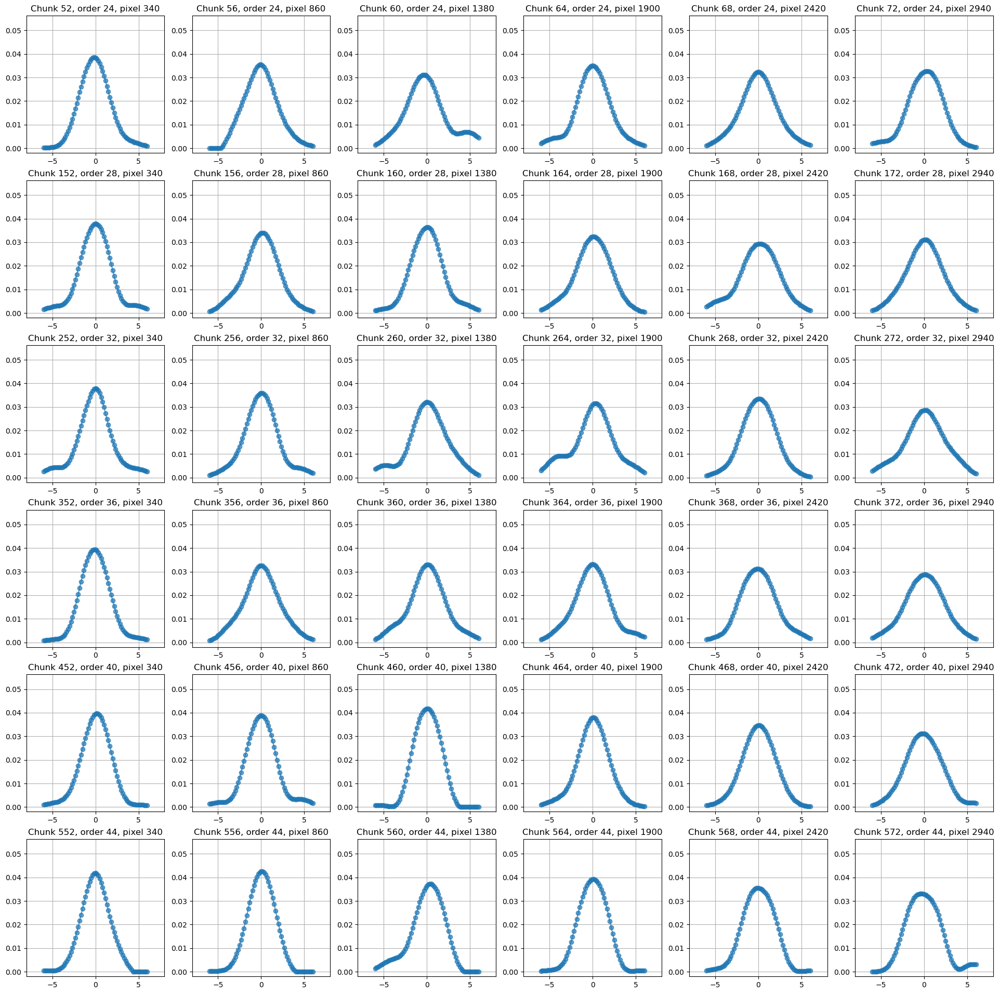

In [38]:
print("Ostar extracted LSFs plotting: ", ostar_name)
# The LSF model, oversampling and convolution width used
lsf_model      = fit_results_1[0].model.lsf_model
osample_factor = fit_results_1[0].model.osample_factor
conv_width     = fit_results_1[0].model.conv_width

# Generate the pixel vector to evaluate the LSF over
lsf_x = lsf_model.generate_x(osample_factor=osample_factor, conv_width=conv_width)

# Now loop over all chunks, evaluate the LSFs and append them to a list
lsfs = []
for i in range(len(fit_results_1)):
    lsf_pars = fit_results_1[i].params.filter('lsf')
    lsfs.append(lsf_model.eval(lsf_x, lsf_pars))

# Finally plot a grid of 3x3 LSFs
pyodine.plot_lib.plot_lsfs_grid(lsfs, chunks, x_lsf=lsf_x, x_nr=6, y_nr=6, 
                                alpha=0.7, xlim=(-8,8), show_plot=True)

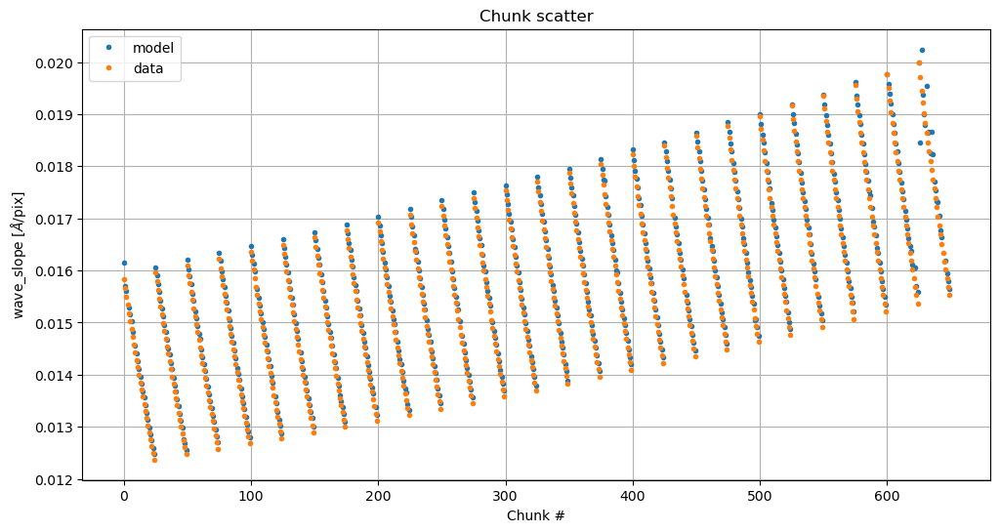

In [39]:
# The best-fit wavelength slopes for all chunks
wave_slopes_model = [r.params['wave_slope'] for r in fit_results_1]
# The estimated dispersion for all chunks (from the original spectrum)
wave_slopes_data = [(ch.wave[-1]-ch.wave[0])/len(ch) for ch in chunks]

pyodine.plot_lib.plot_chunk_scatter(scatter=[wave_slopes_model,wave_slopes_data], 
                                    scatter_fmt='.', scatter_label=['model', 'data'], 
                                    ylabel=r'wave_slope [$\AA$/pix]', show_plot=True)

Chunk 10: Wave slope difference = 1.173025e-04 A/pix


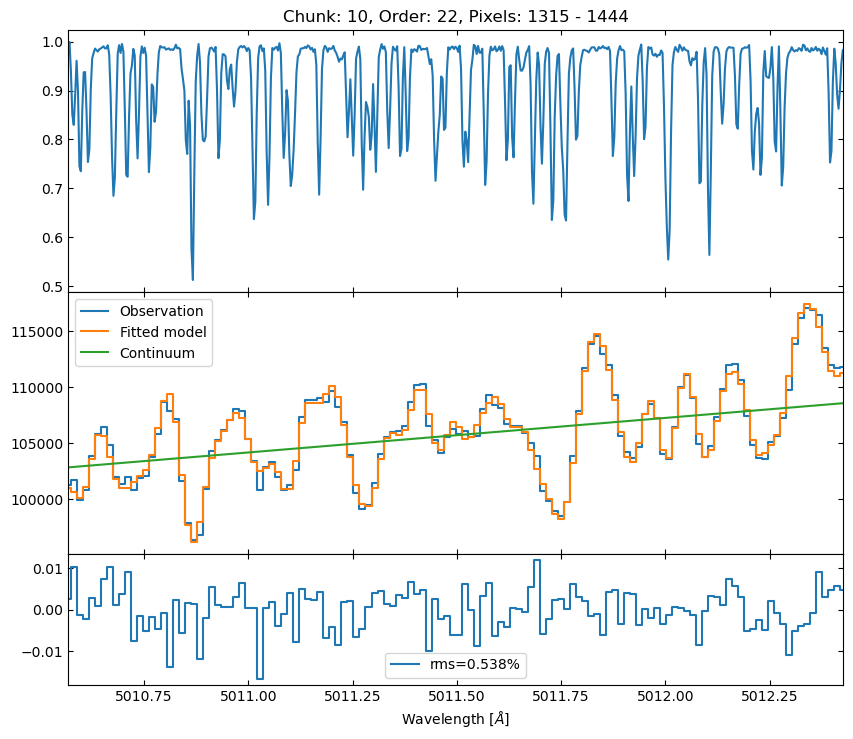

Chunk 20: Wave slope difference = 8.700177e-05 A/pix


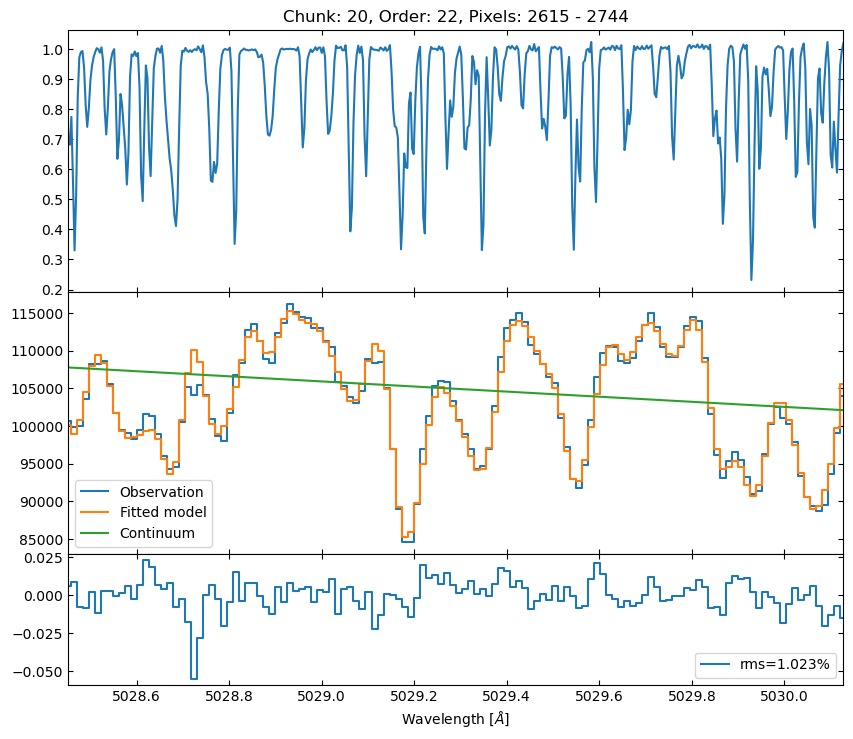

Chunk 30: Wave slope difference = 1.222835e-04 A/pix


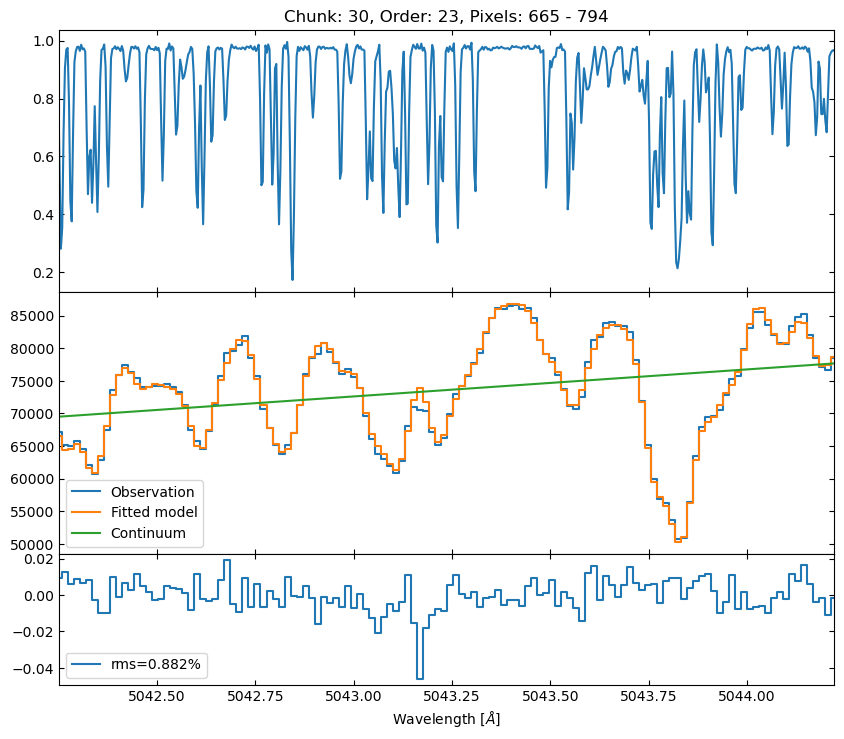

Chunk 40: Wave slope difference = 1.010248e-04 A/pix


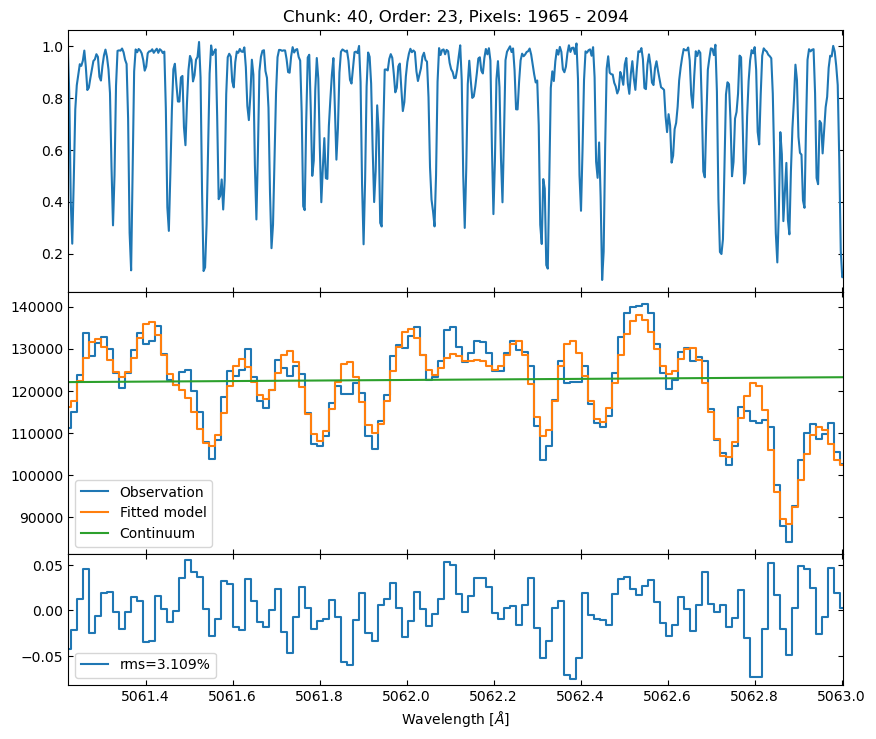

Chunk 50: Wave slope difference = 1.249079e-04 A/pix


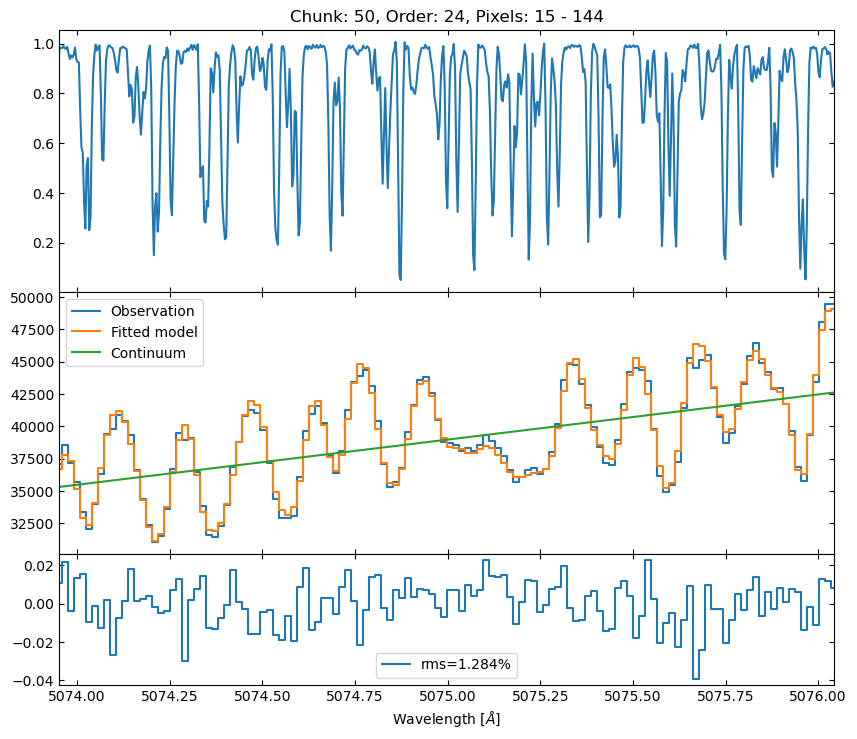

Chunk 60: Wave slope difference = 1.750430e-04 A/pix


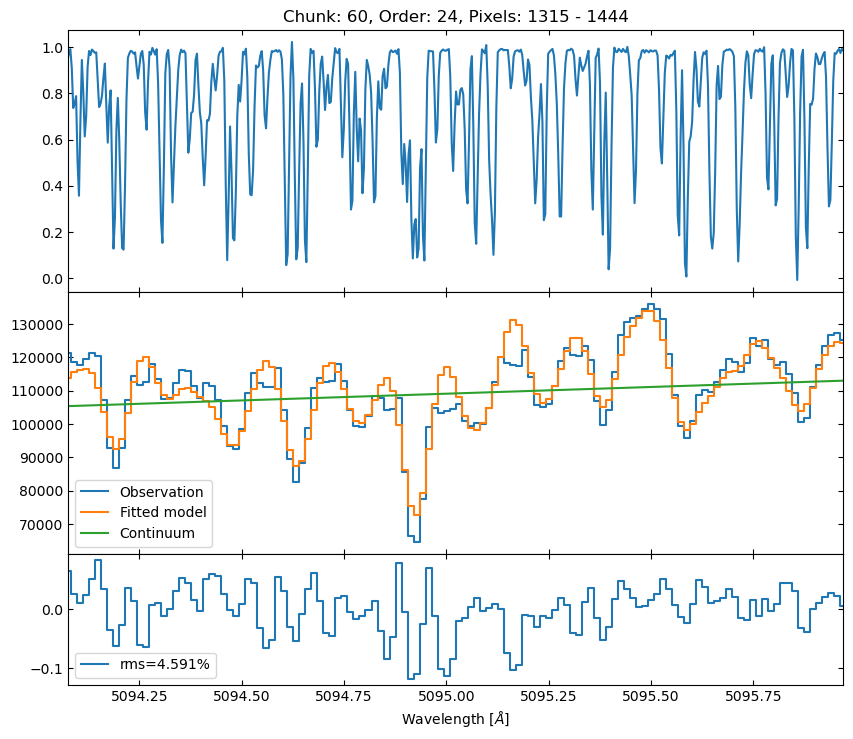

Chunk 70: Wave slope difference = 1.004114e-04 A/pix


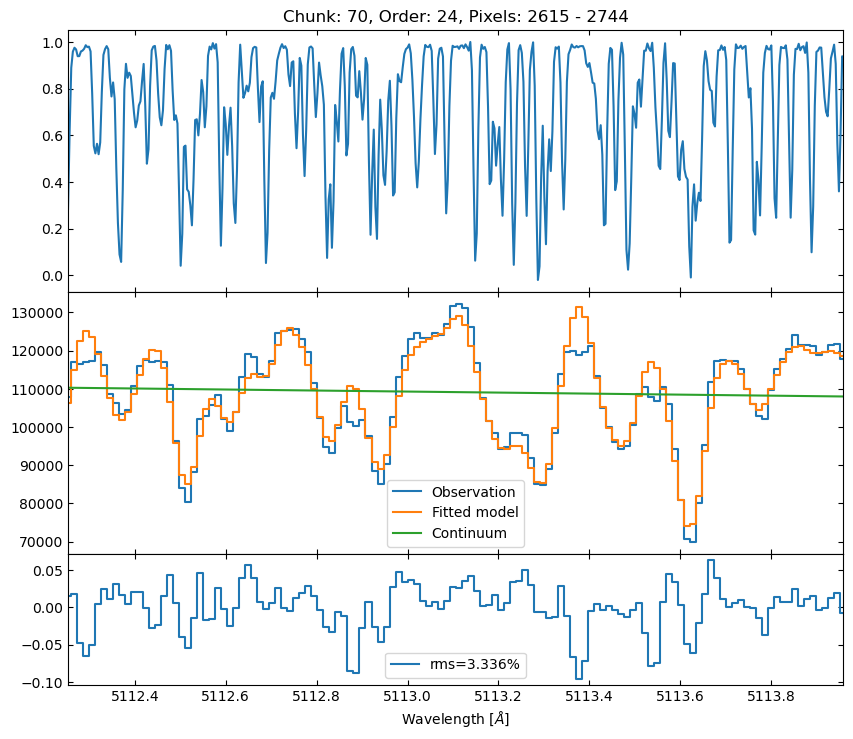

Chunk 80: Wave slope difference = 1.097135e-04 A/pix


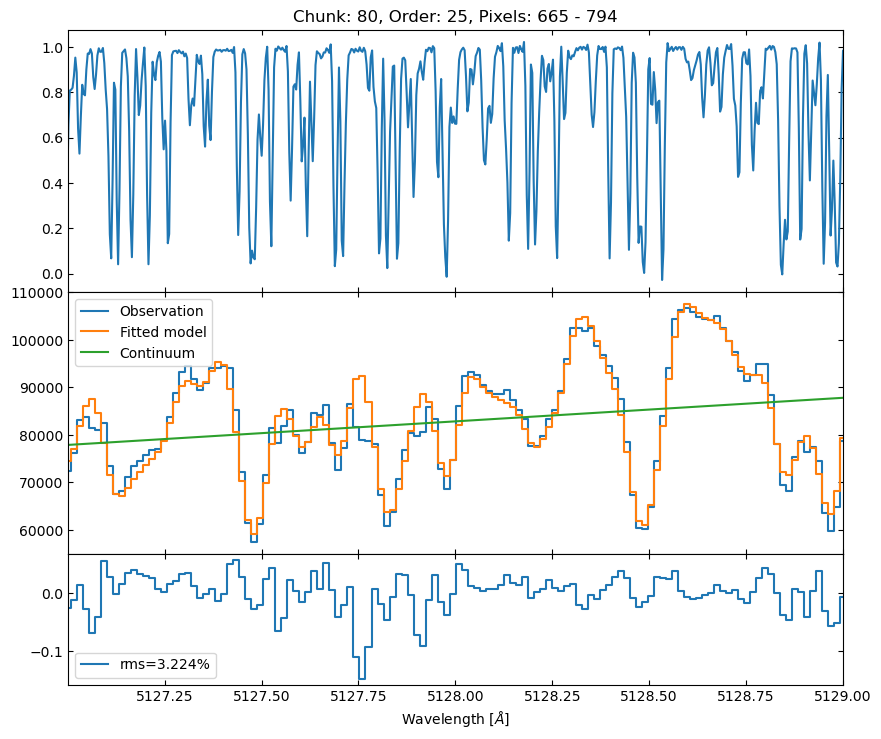

Chunk 90: Wave slope difference = 9.792839e-05 A/pix


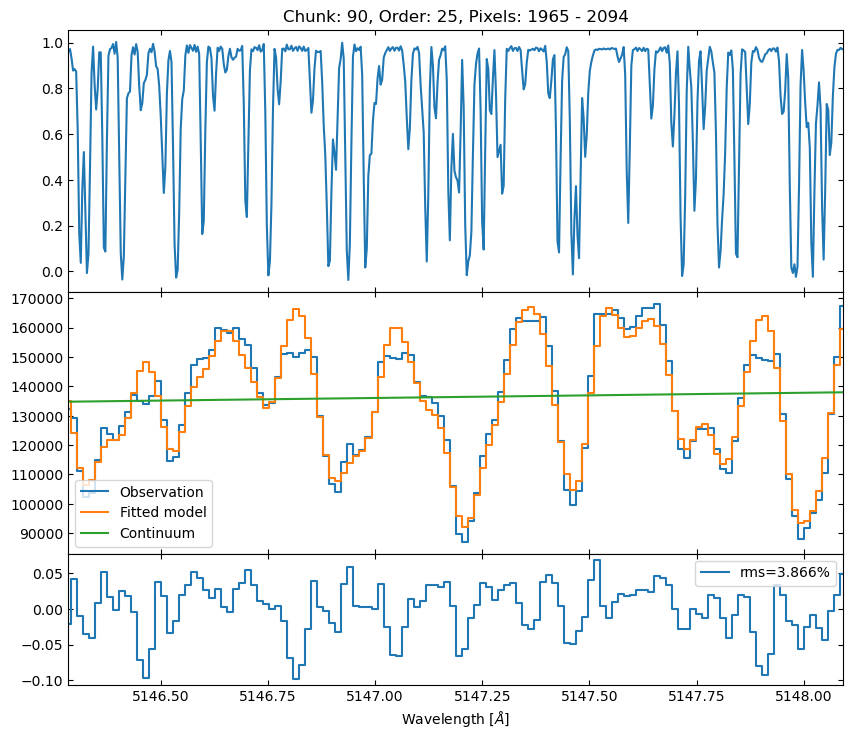

Chunk 100: Wave slope difference = 1.124599e-04 A/pix


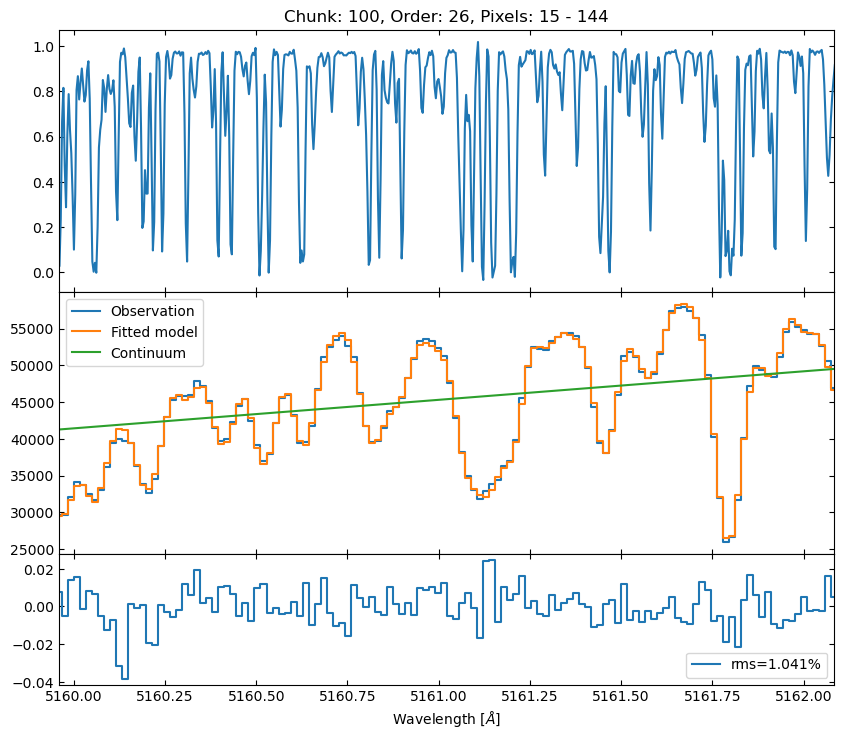

Chunk 110: Wave slope difference = 1.211009e-04 A/pix


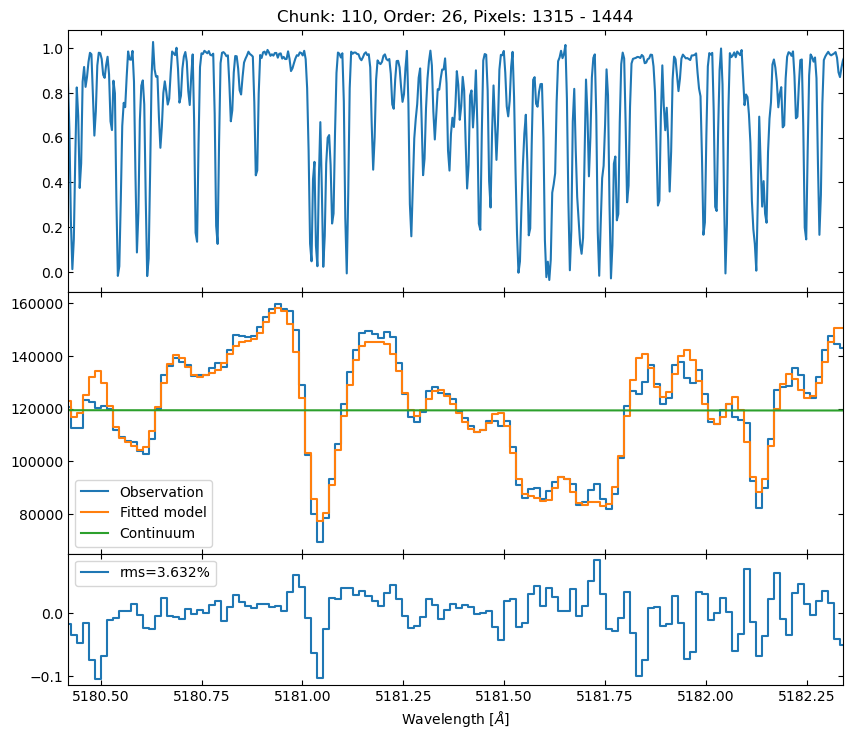

Chunk 120: Wave slope difference = 1.165124e-04 A/pix


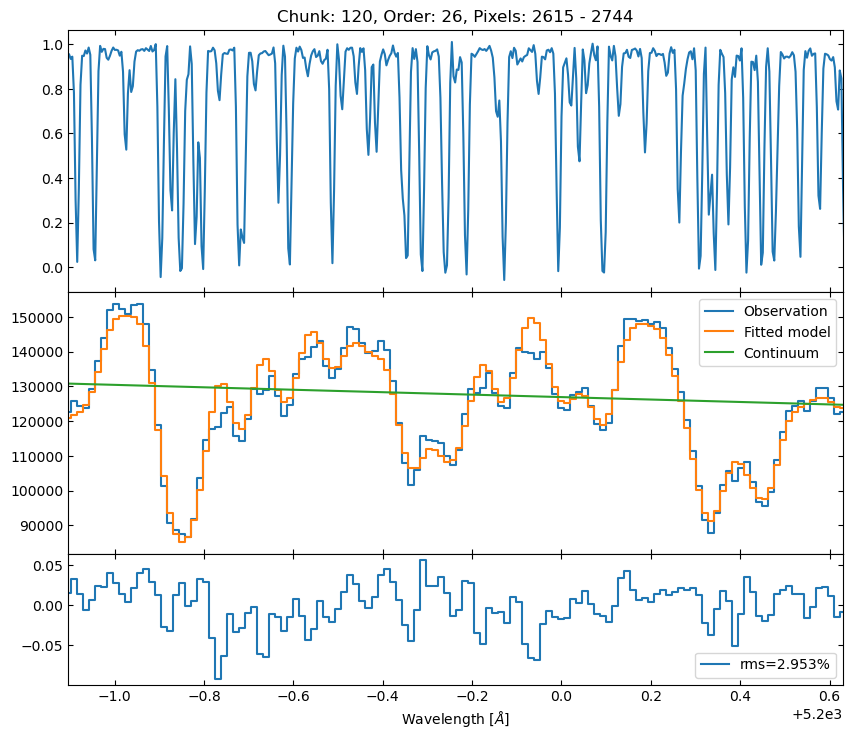

Chunk 130: Wave slope difference = 1.410983e-04 A/pix


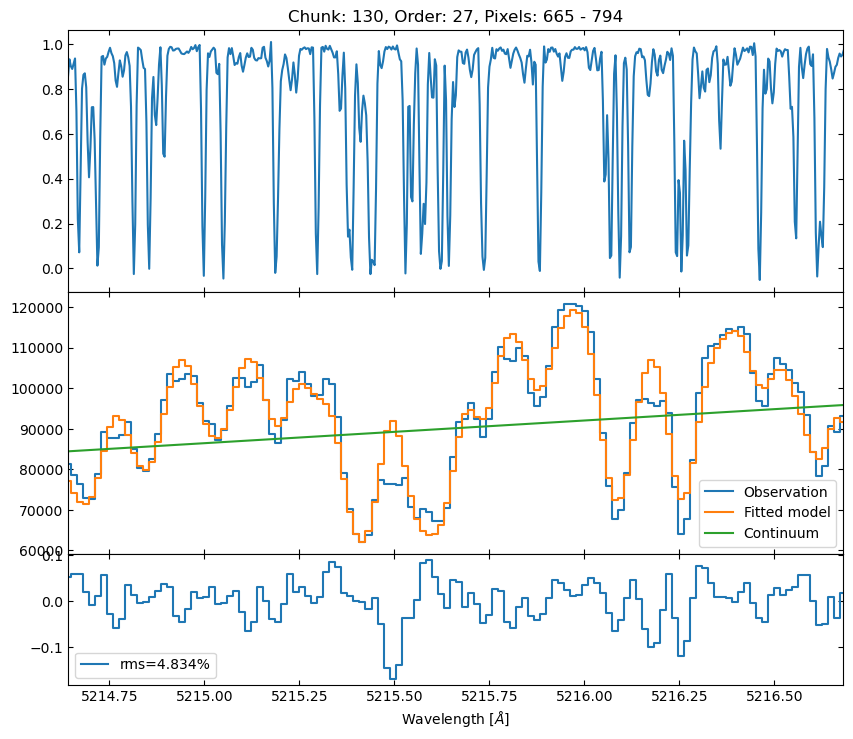

Chunk 140: Wave slope difference = 1.077353e-04 A/pix


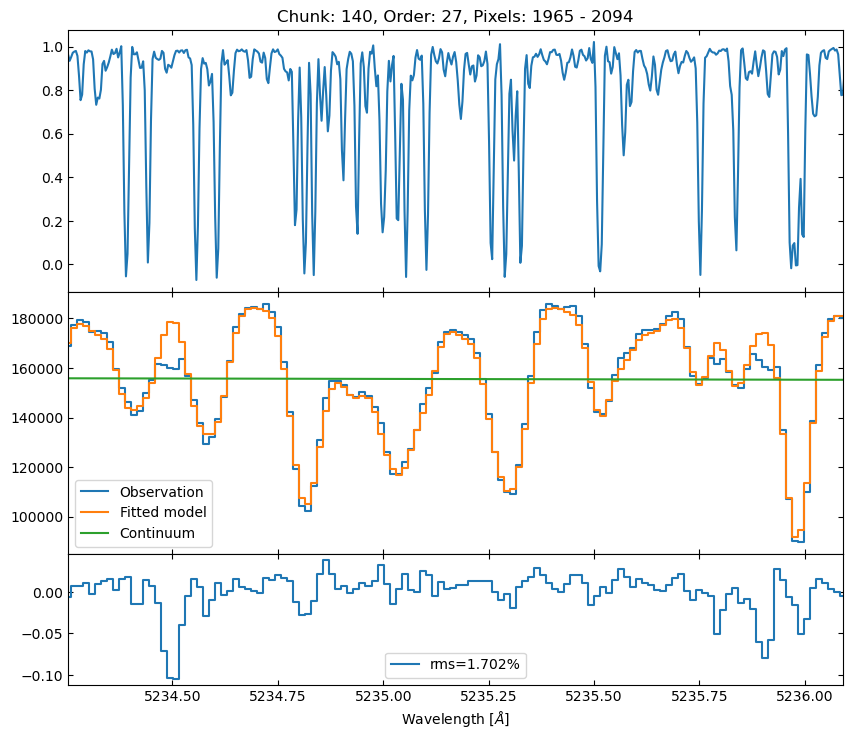

Chunk 150: Wave slope difference = 8.978966e-05 A/pix


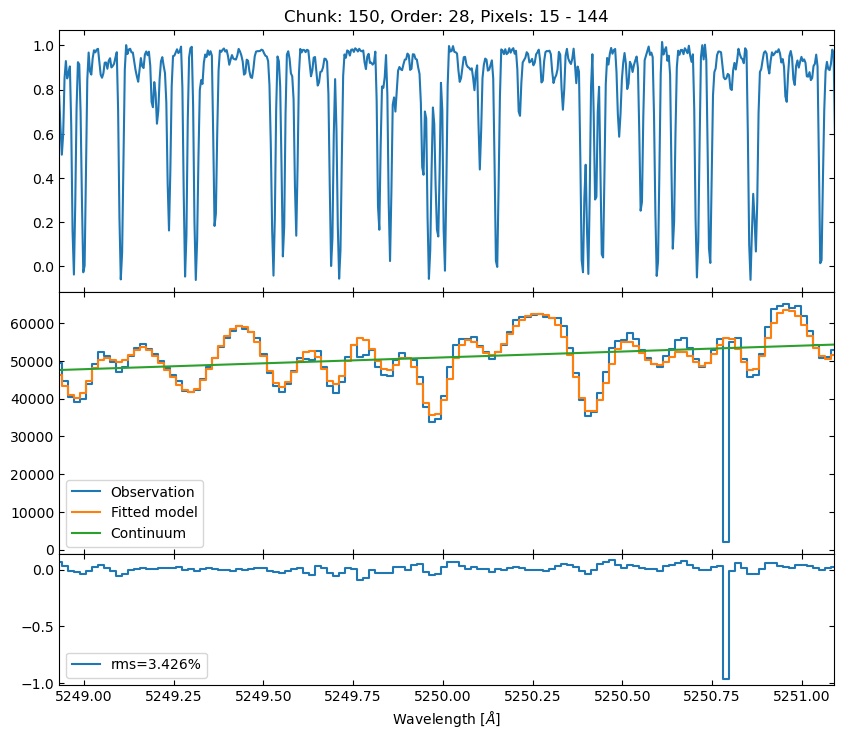

Chunk 160: Wave slope difference = 1.179732e-04 A/pix


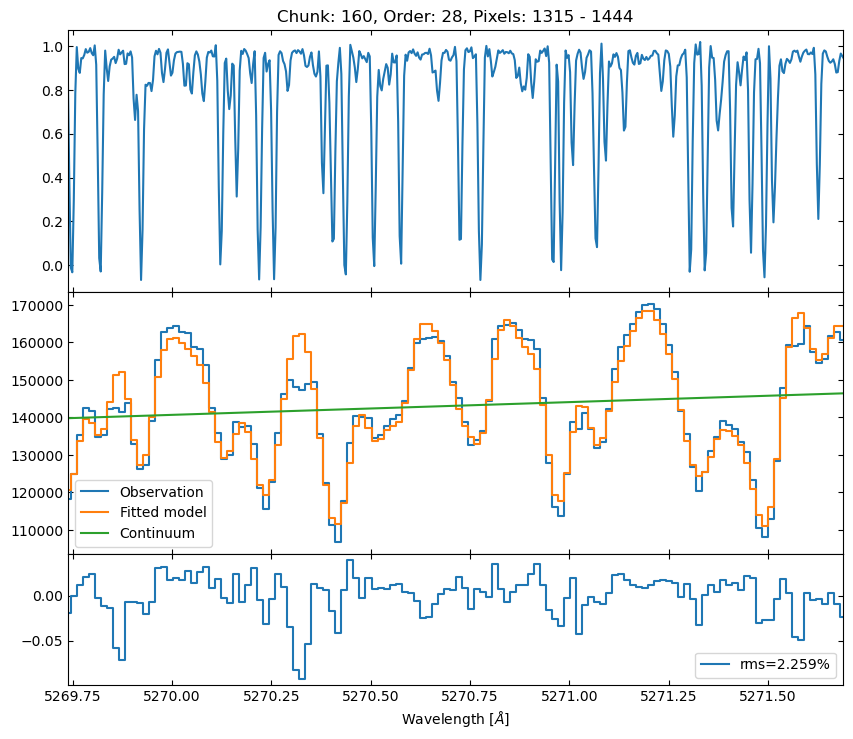

Chunk 170: Wave slope difference = 4.426431e-05 A/pix


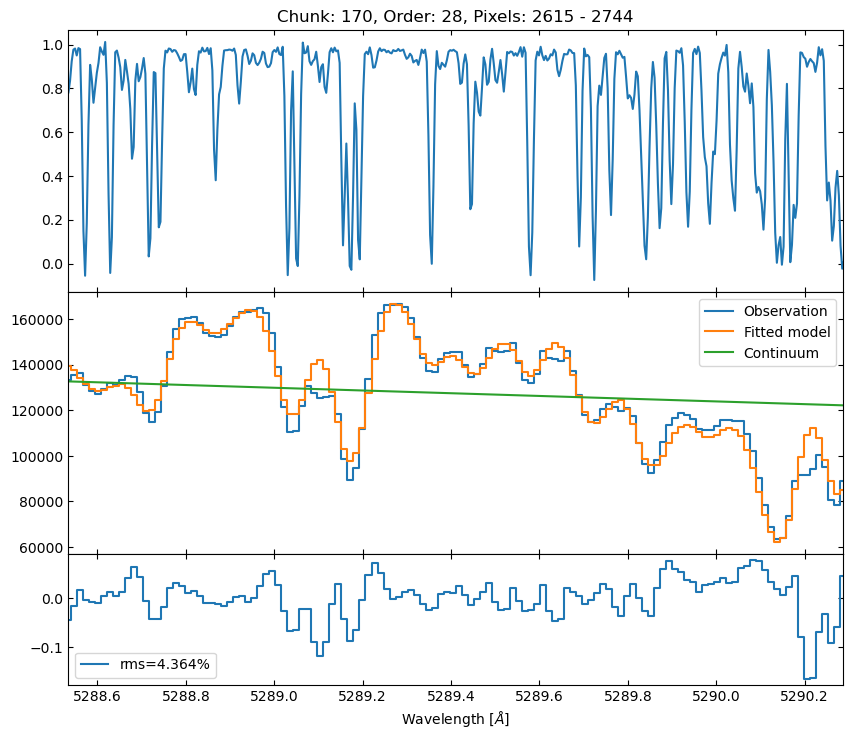

Chunk 180: Wave slope difference = 1.479781e-04 A/pix


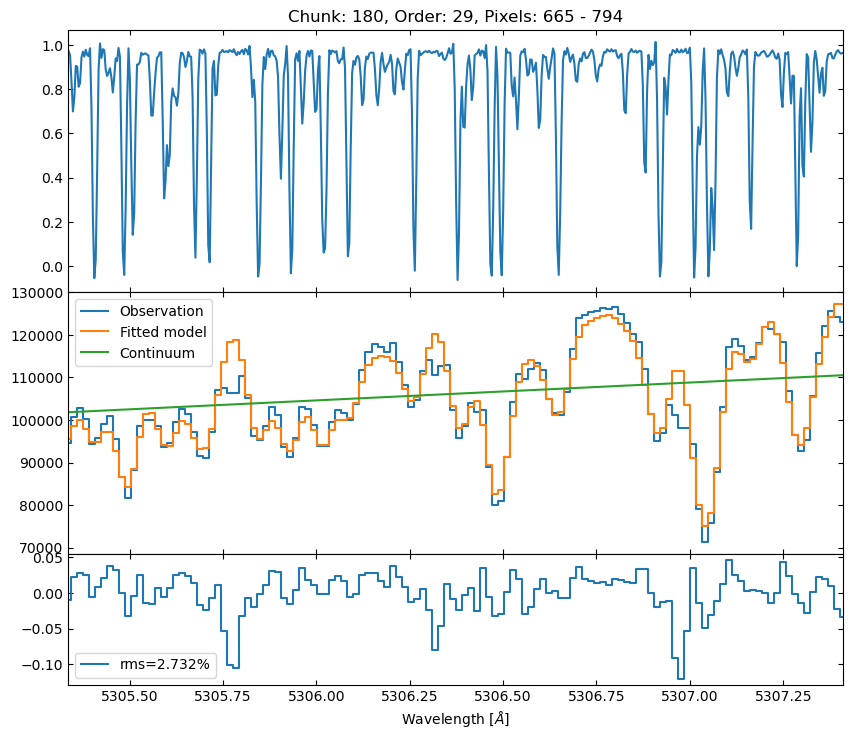

Chunk 190: Wave slope difference = 1.245562e-04 A/pix


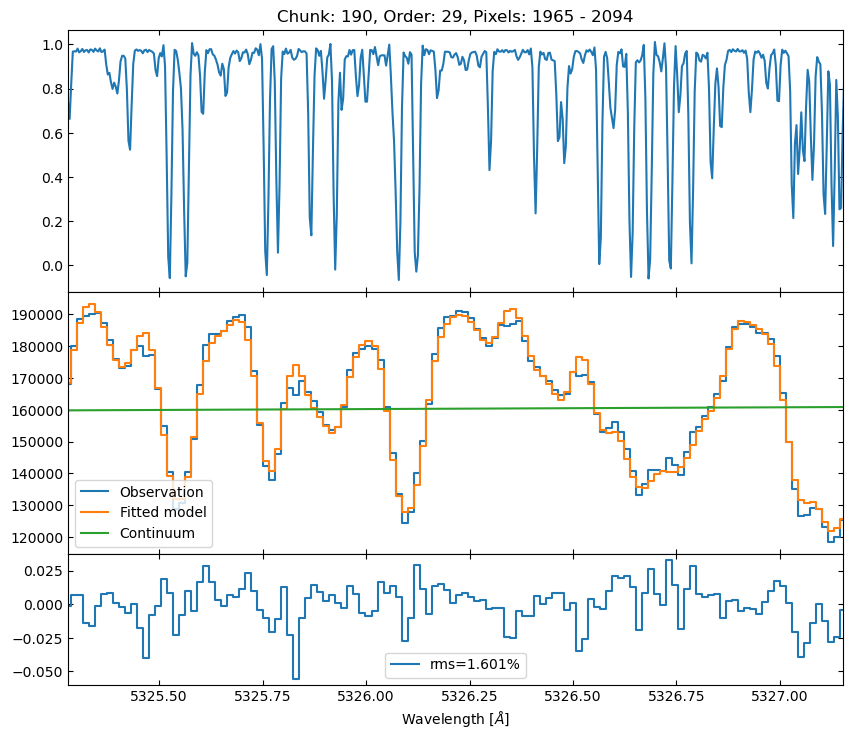

Chunk 200: Wave slope difference = 1.029149e-04 A/pix


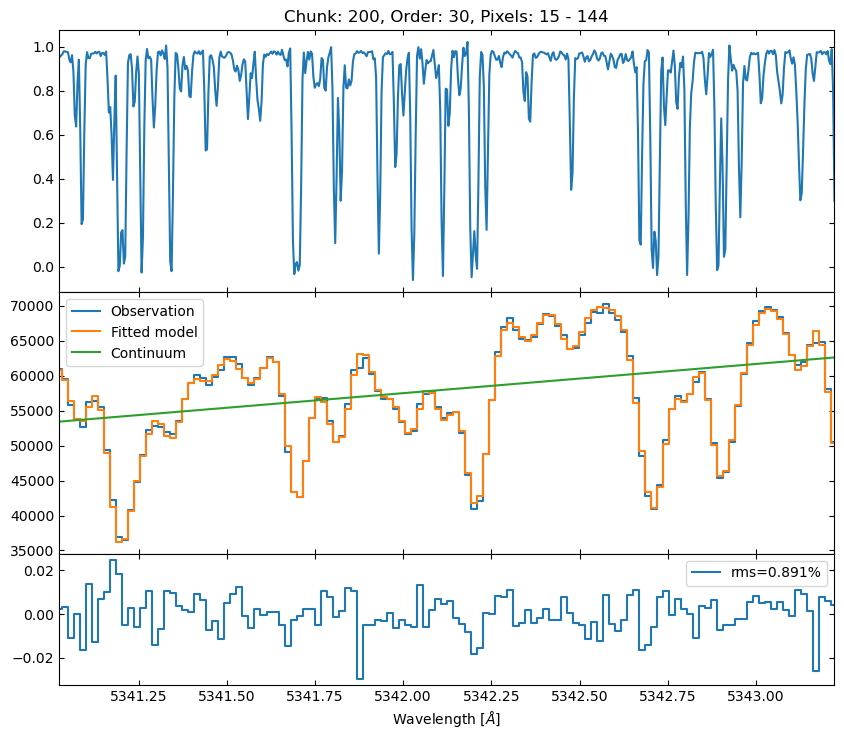

Chunk 210: Wave slope difference = 1.254361e-04 A/pix


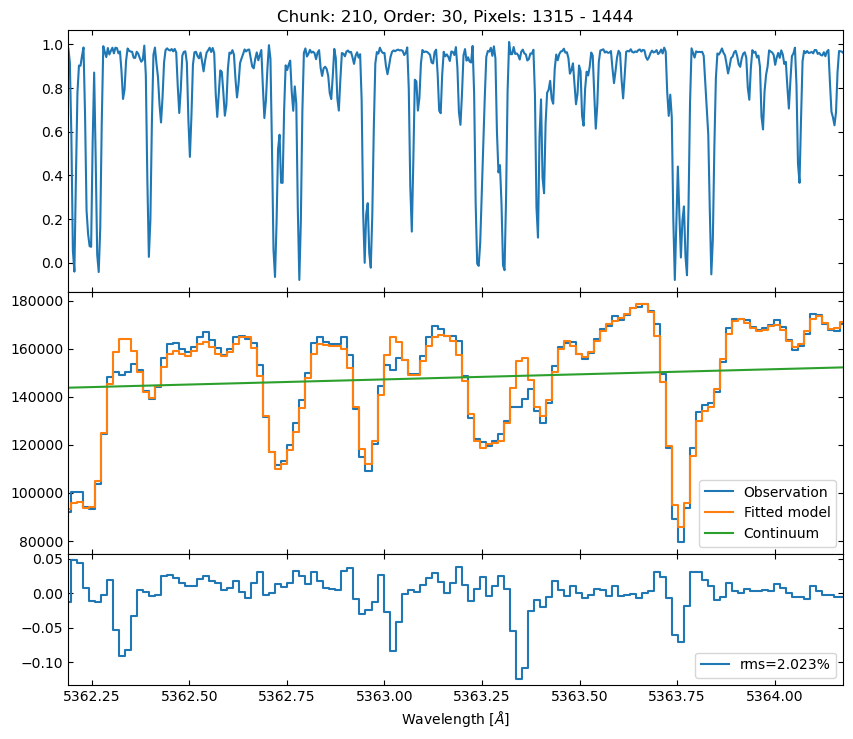

Chunk 220: Wave slope difference = 9.183282e-05 A/pix


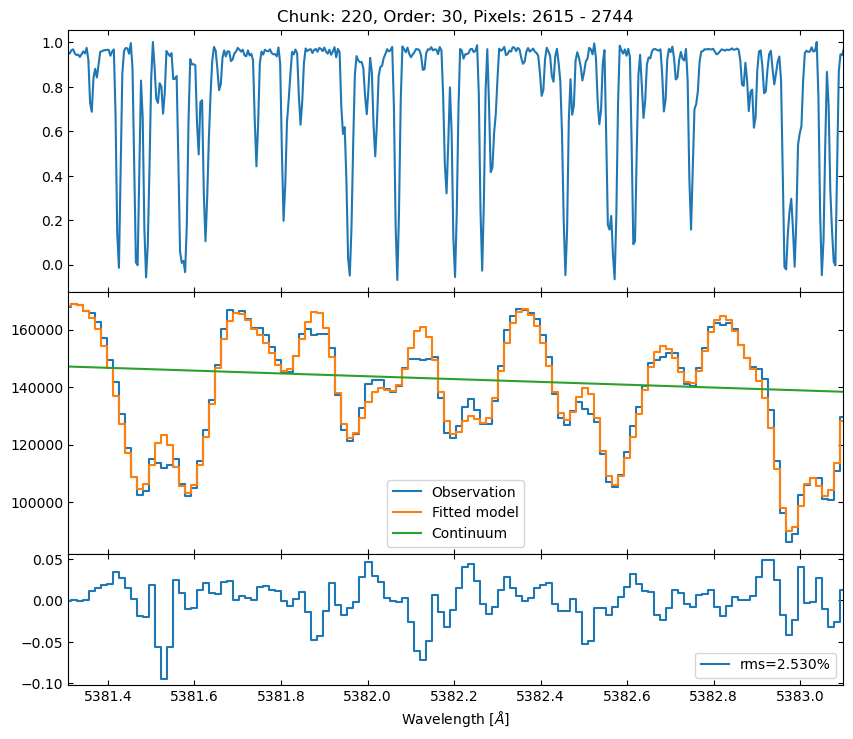

Chunk 230: Wave slope difference = 1.550313e-04 A/pix


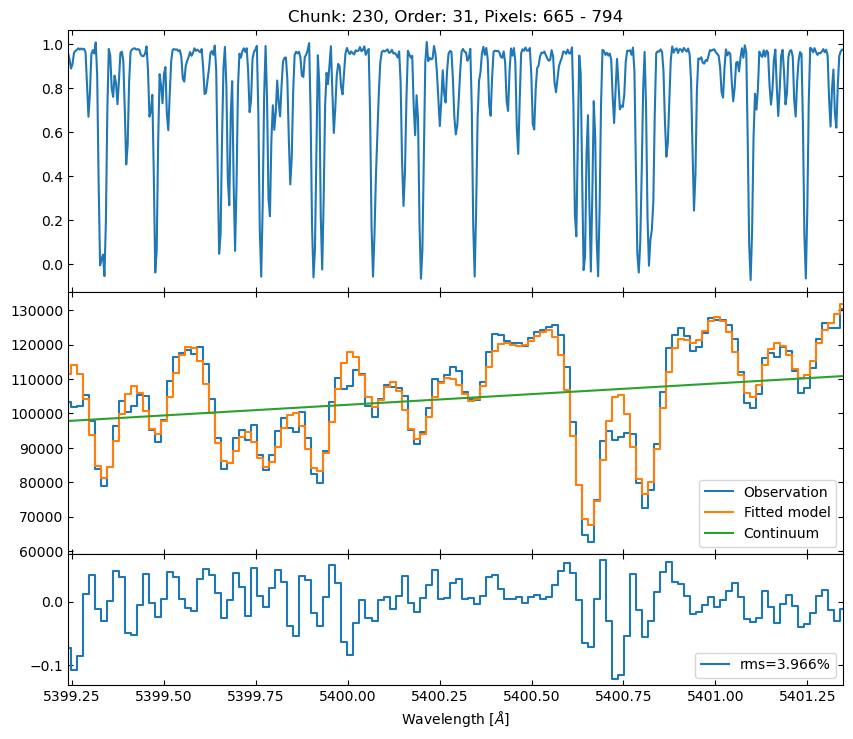

Chunk 240: Wave slope difference = 1.268469e-04 A/pix


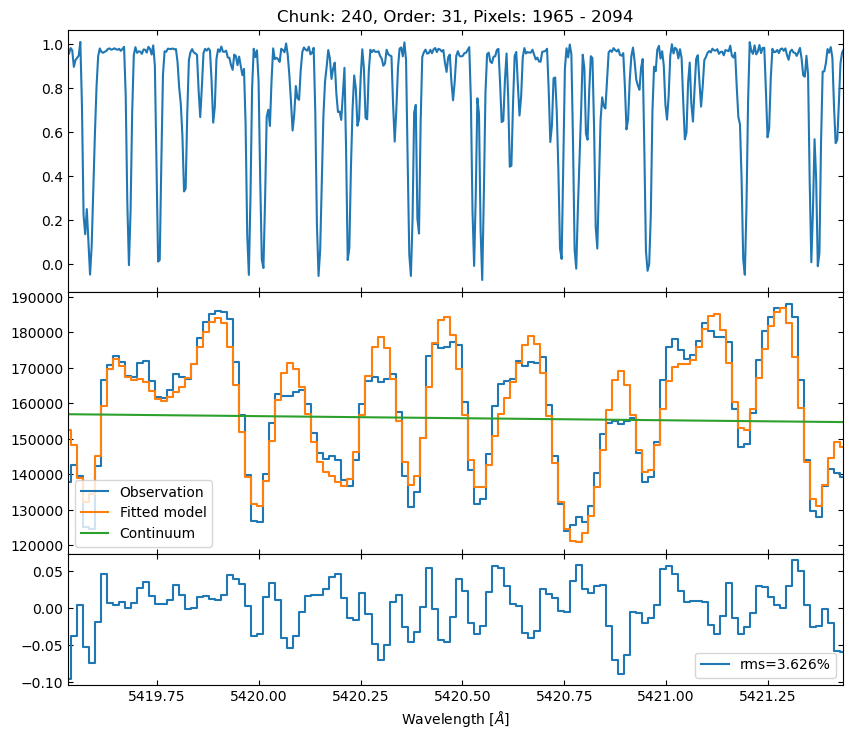

Chunk 250: Wave slope difference = 1.146488e-04 A/pix


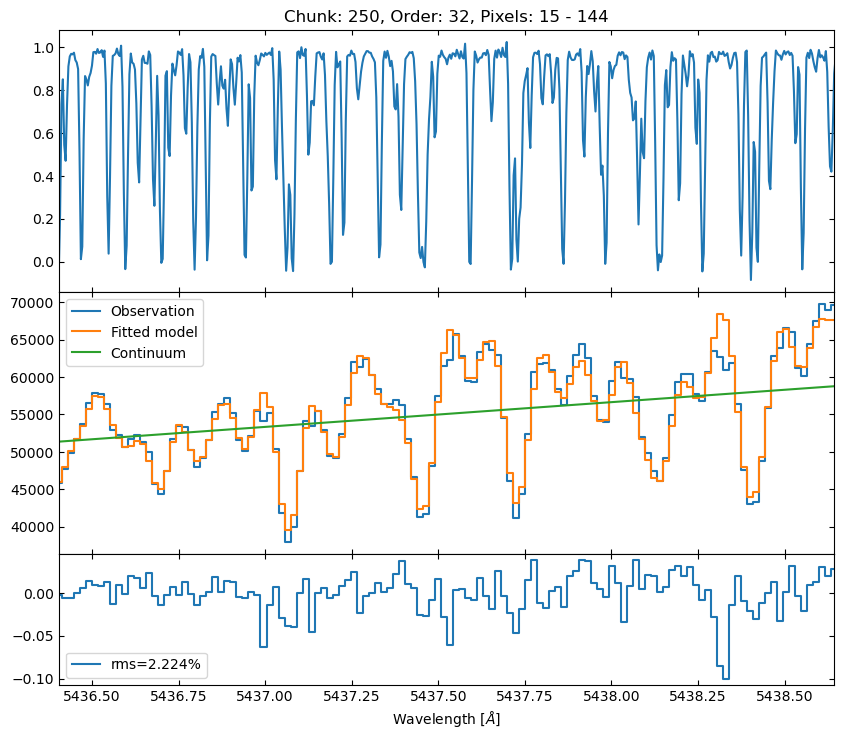

Chunk 260: Wave slope difference = 1.312148e-04 A/pix


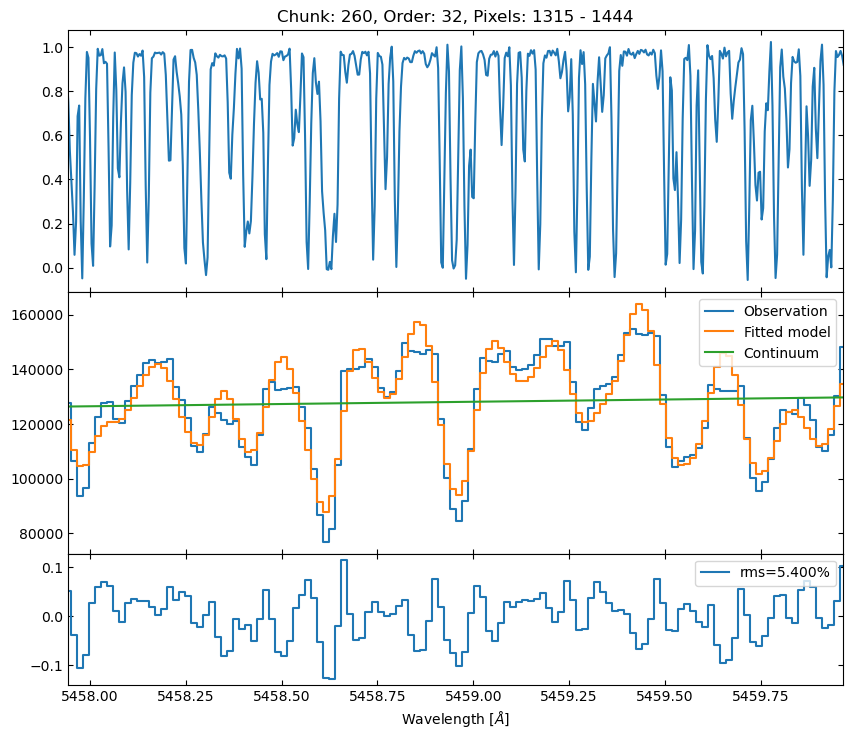

Chunk 270: Wave slope difference = 9.698087e-05 A/pix


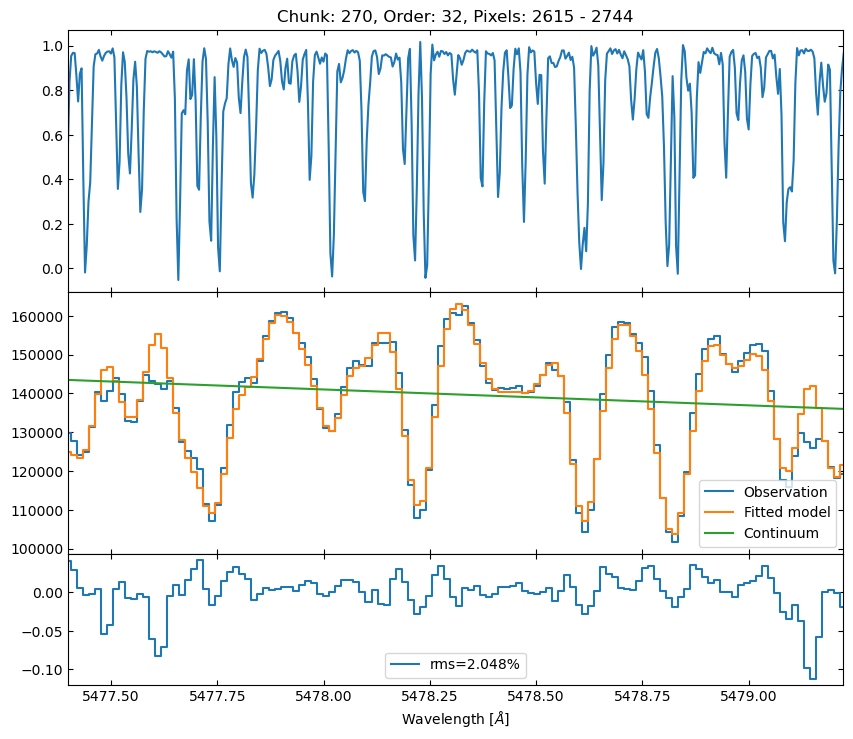

Chunk 280: Wave slope difference = 1.370513e-04 A/pix


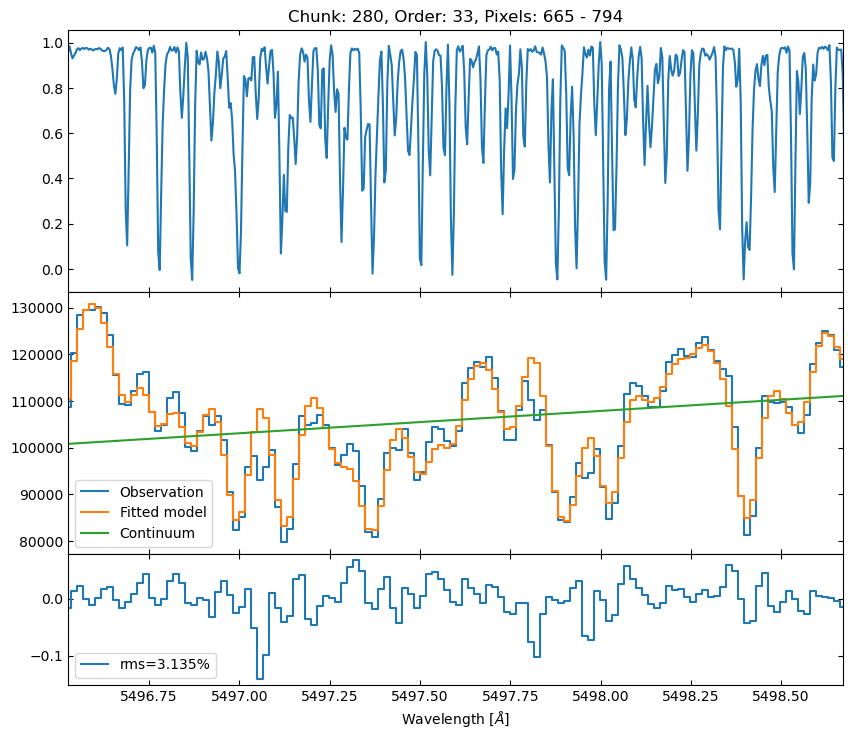

Chunk 290: Wave slope difference = 1.138454e-04 A/pix


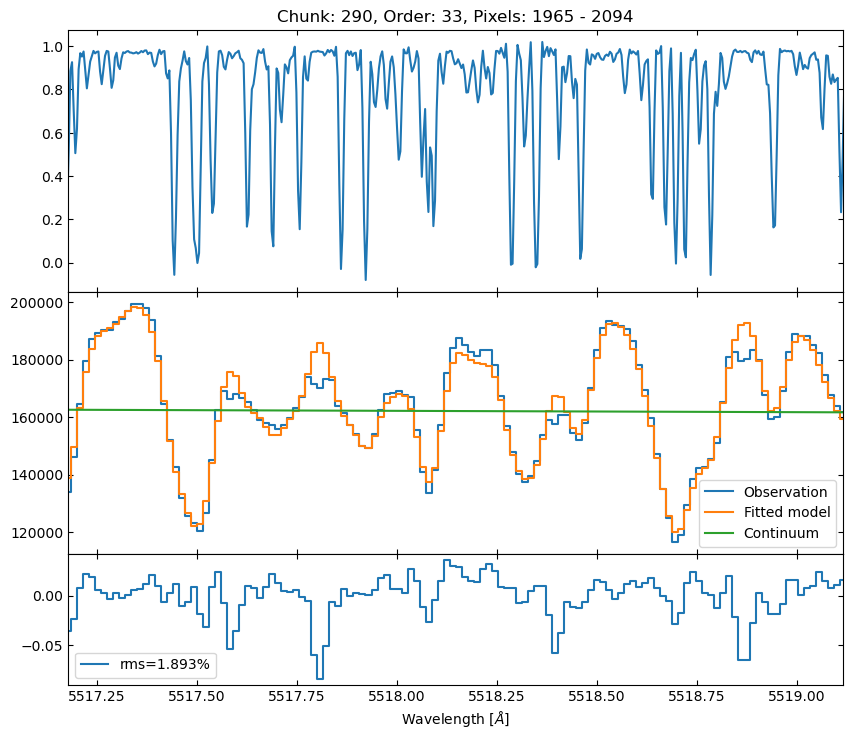

Chunk 300: Wave slope difference = 8.604345e-05 A/pix


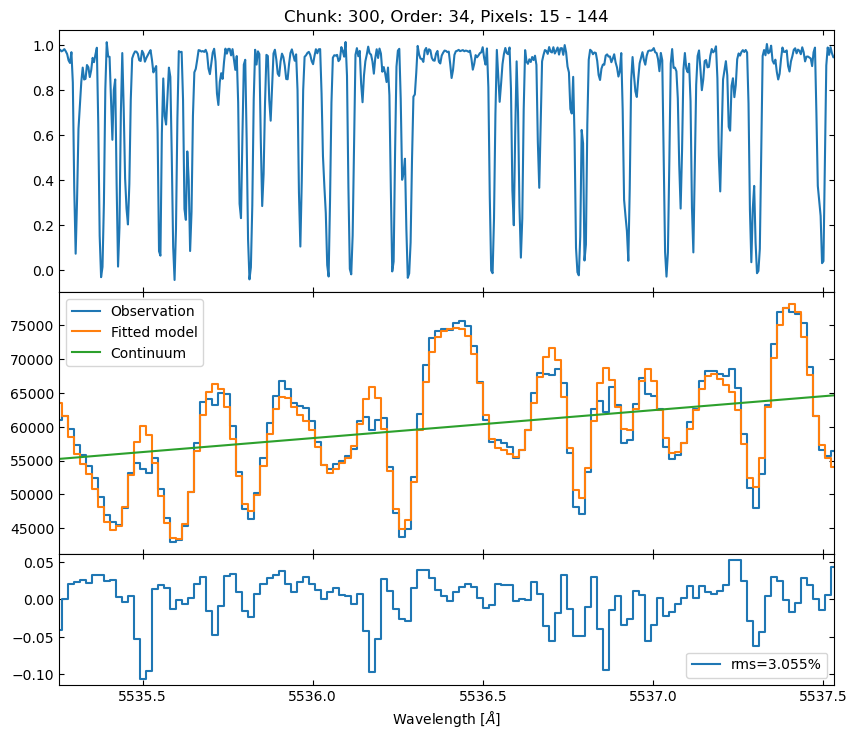

Chunk 310: Wave slope difference = 1.538678e-04 A/pix


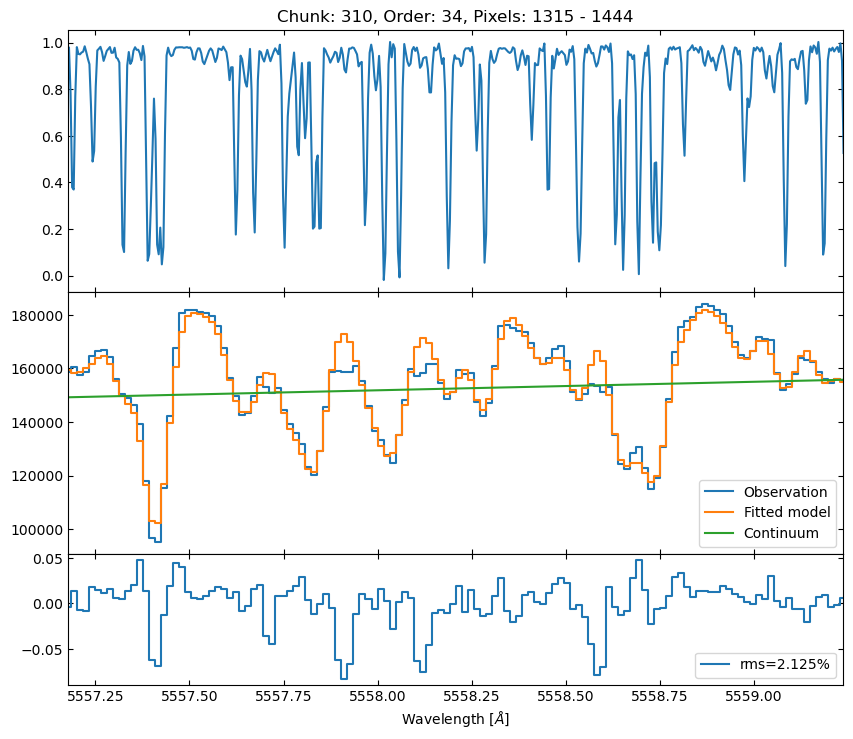

Chunk 320: Wave slope difference = 7.260042e-05 A/pix


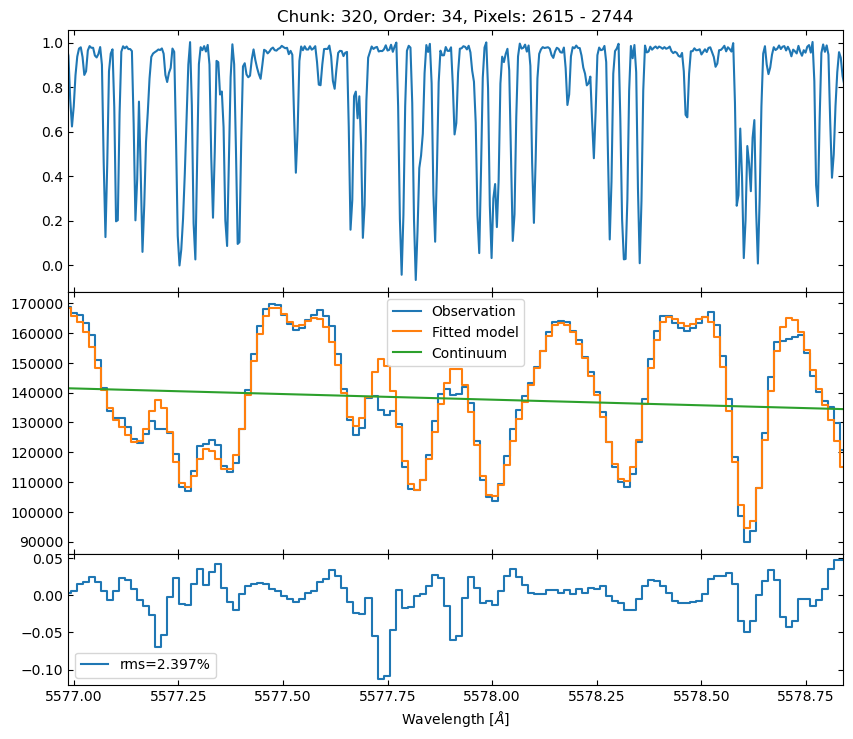

Chunk 330: Wave slope difference = 1.431292e-04 A/pix


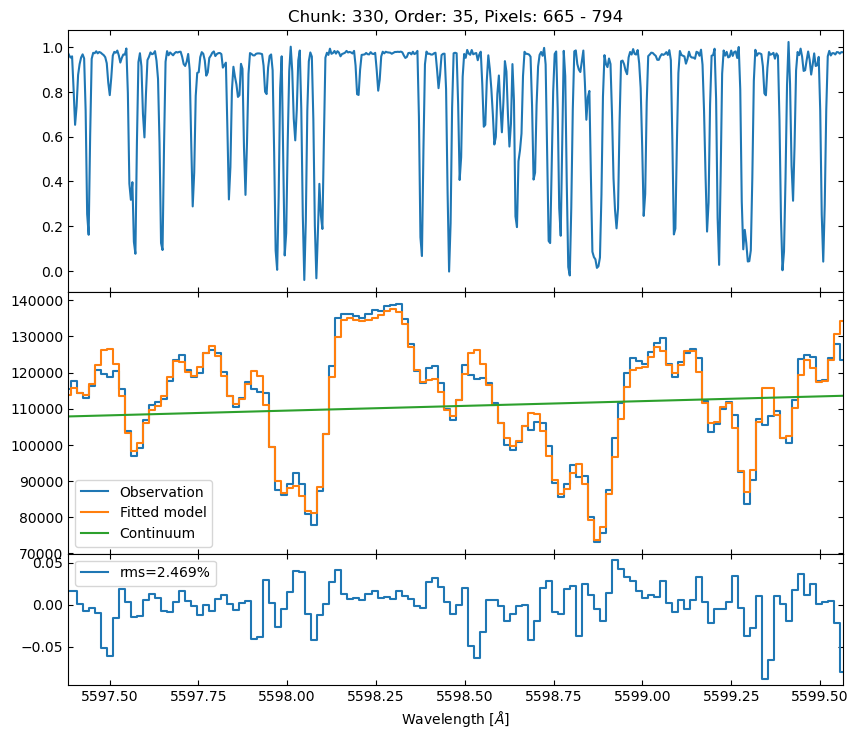

Chunk 340: Wave slope difference = 1.088457e-04 A/pix


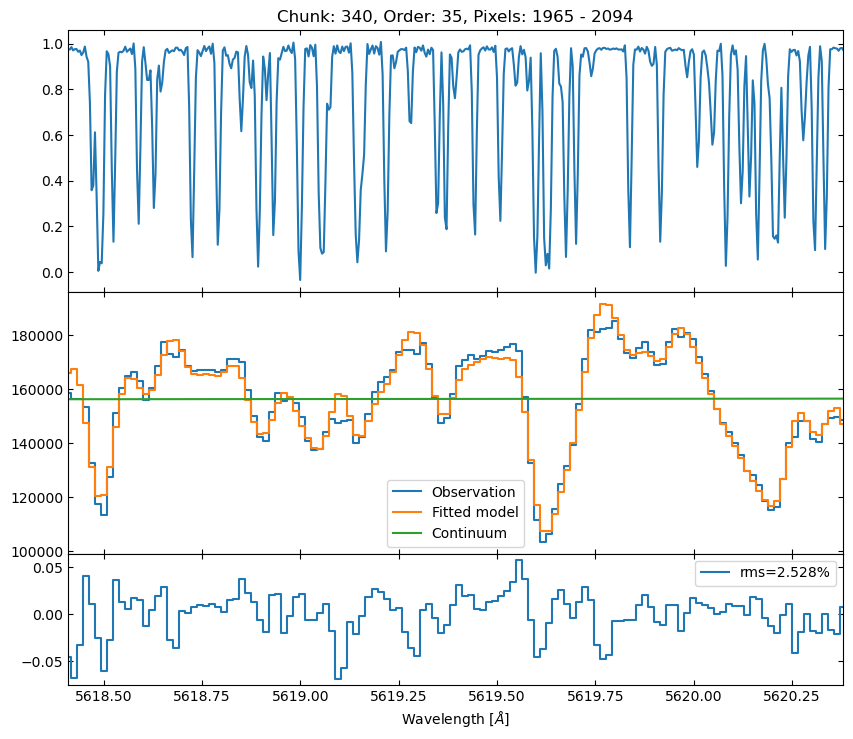

Chunk 350: Wave slope difference = 7.659332e-05 A/pix


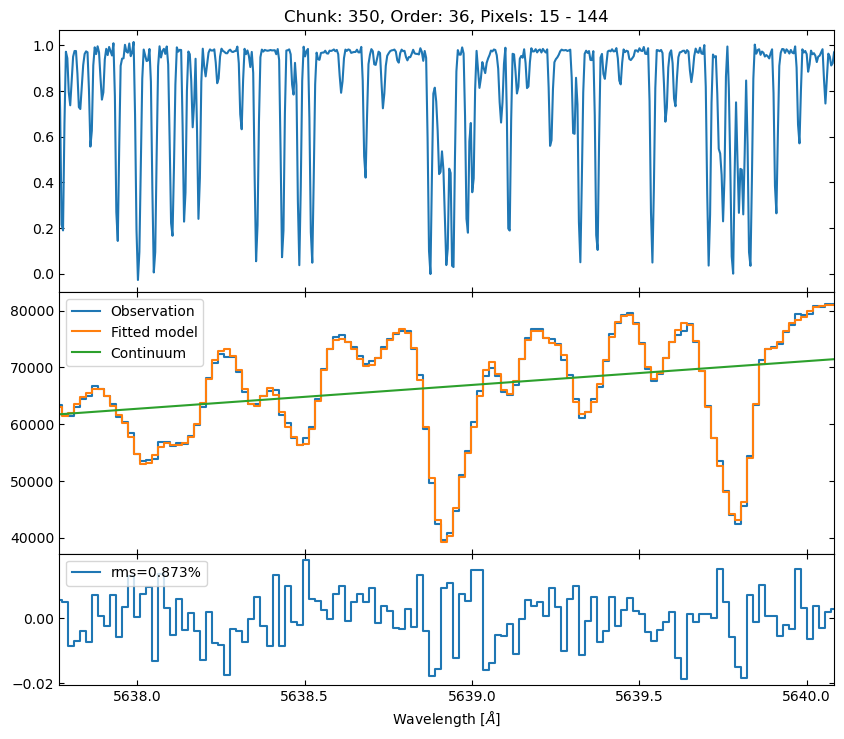

Chunk 360: Wave slope difference = 1.234145e-04 A/pix


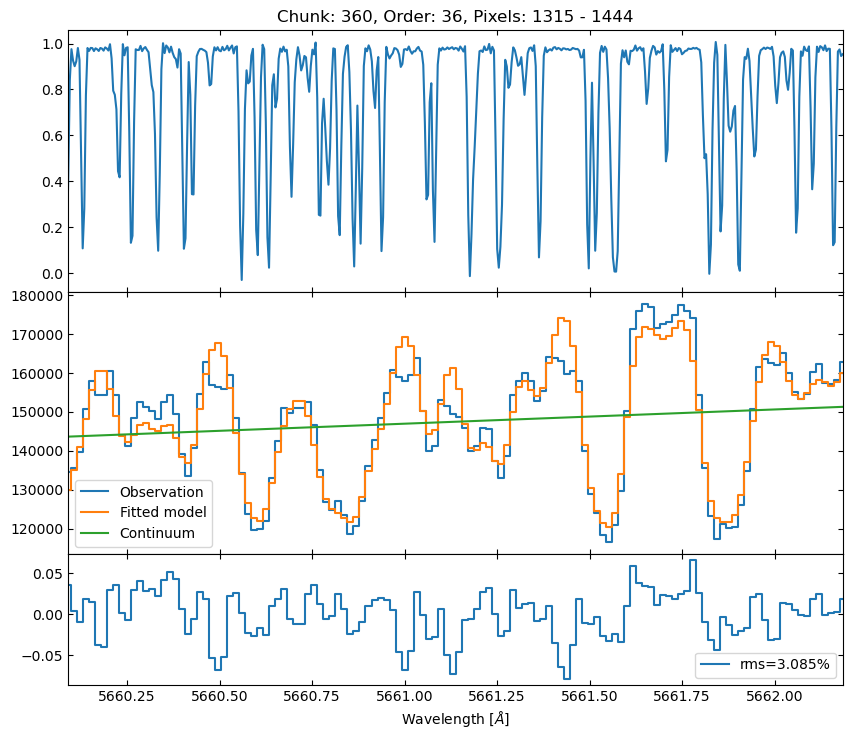

Chunk 370: Wave slope difference = 9.770391e-05 A/pix


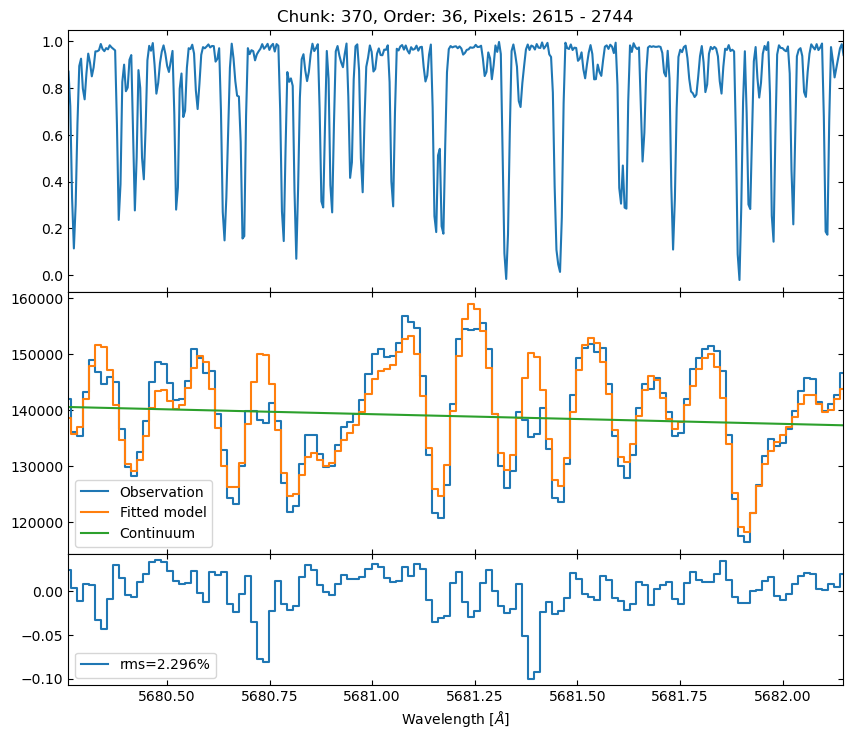

Chunk 380: Wave slope difference = 1.308341e-04 A/pix


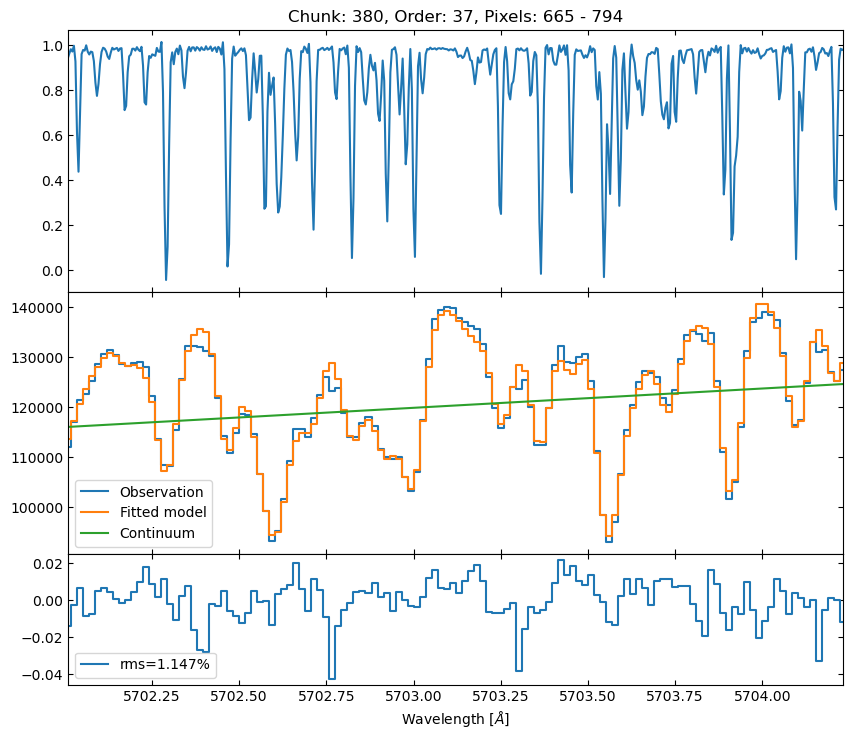

Chunk 390: Wave slope difference = 1.163404e-04 A/pix


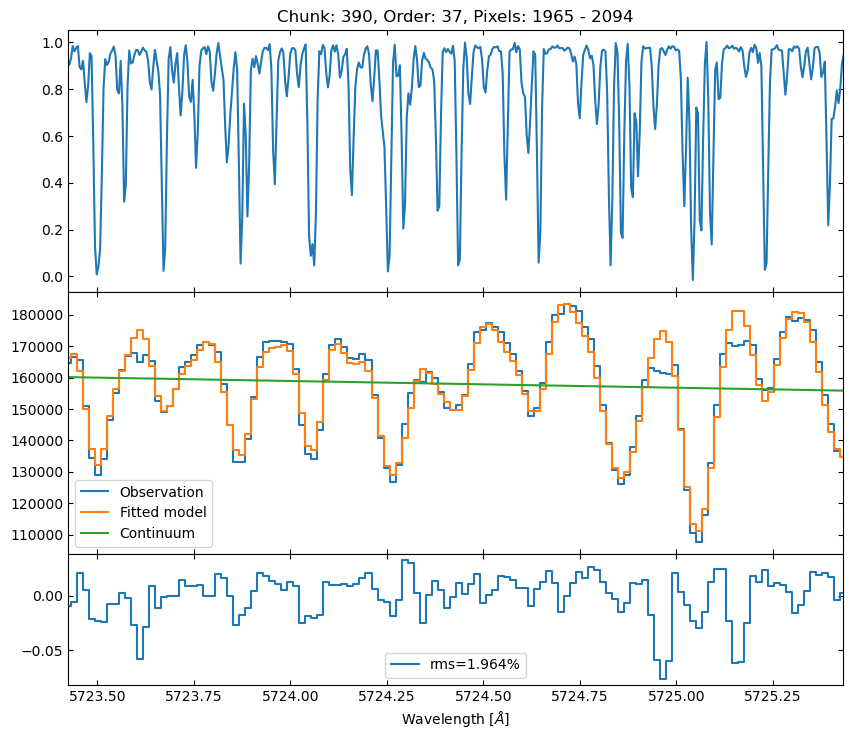

Chunk 400: Wave slope difference = 1.013446e-04 A/pix


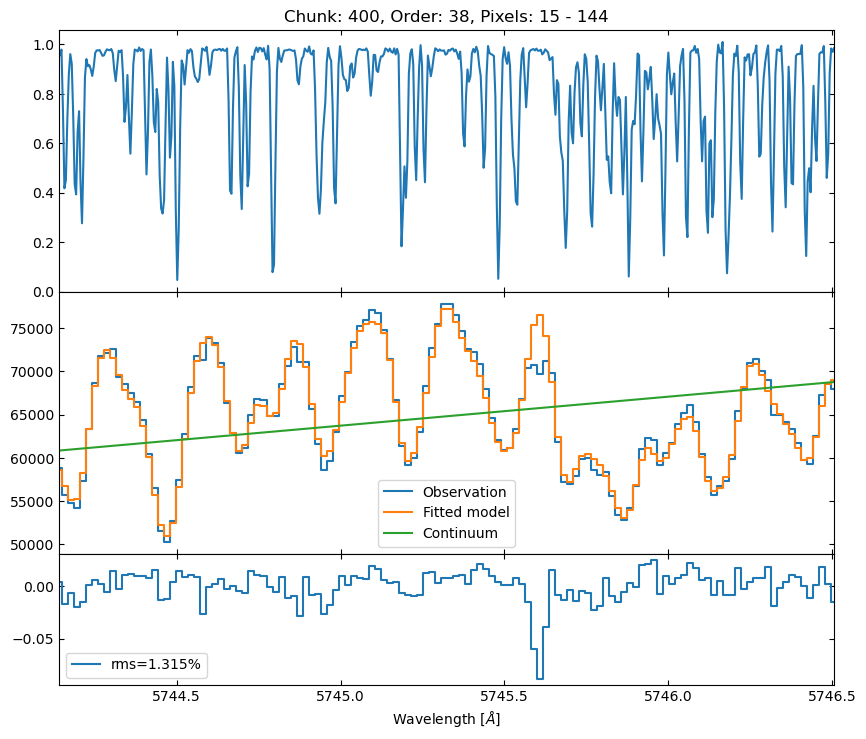

Chunk 410: Wave slope difference = 1.211455e-04 A/pix


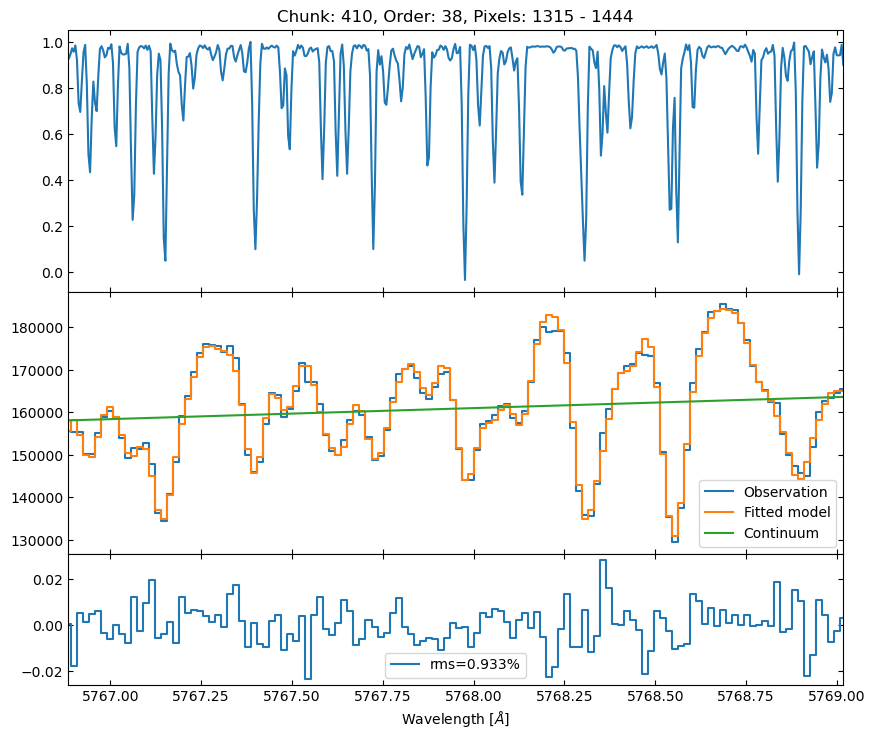

Chunk 420: Wave slope difference = 1.265832e-04 A/pix


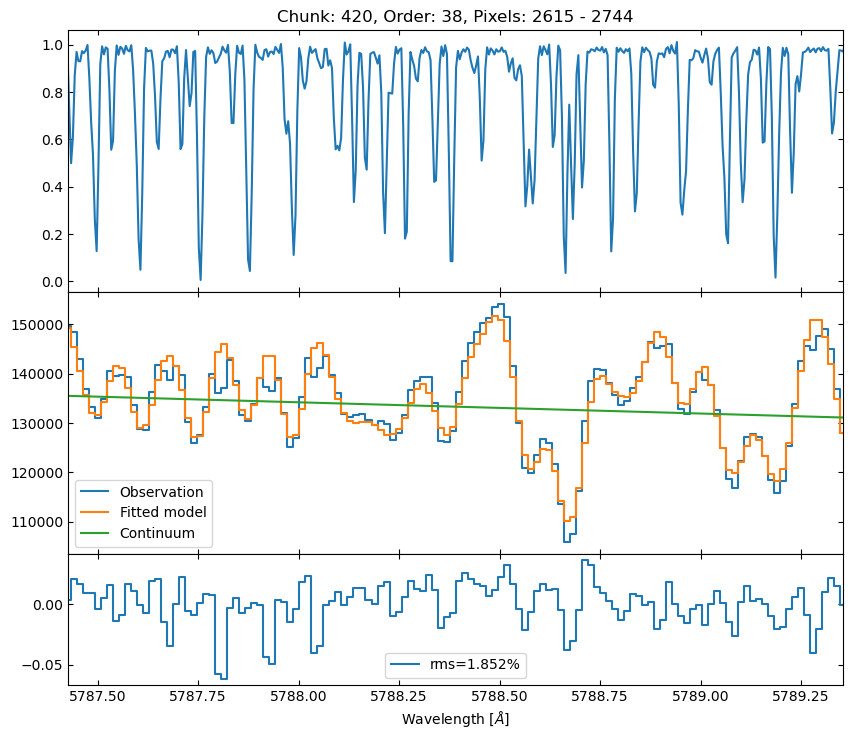

Chunk 430: Wave slope difference = 1.499927e-04 A/pix


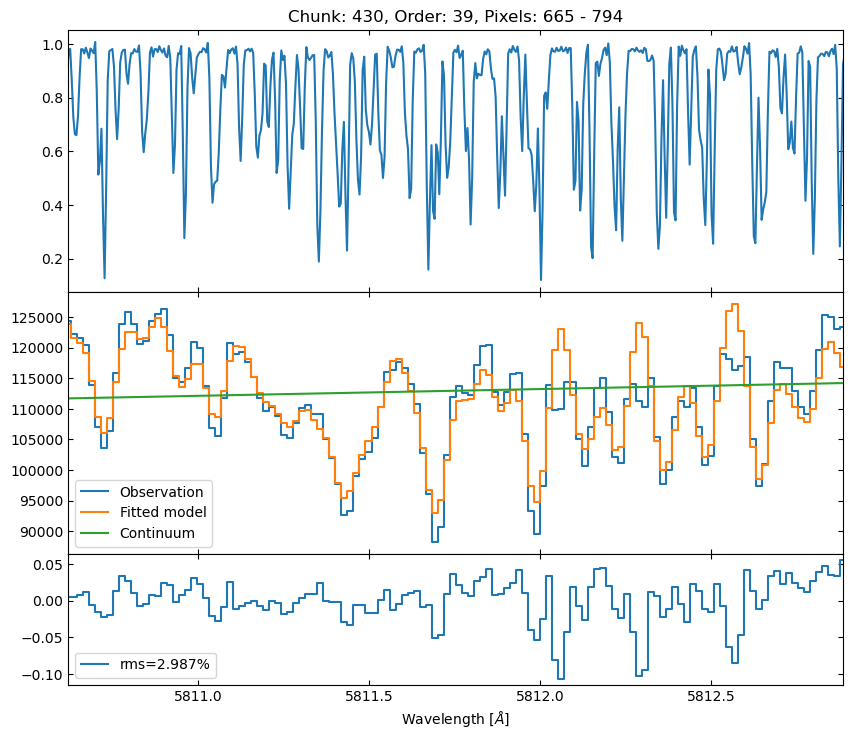

Chunk 440: Wave slope difference = 1.105977e-04 A/pix


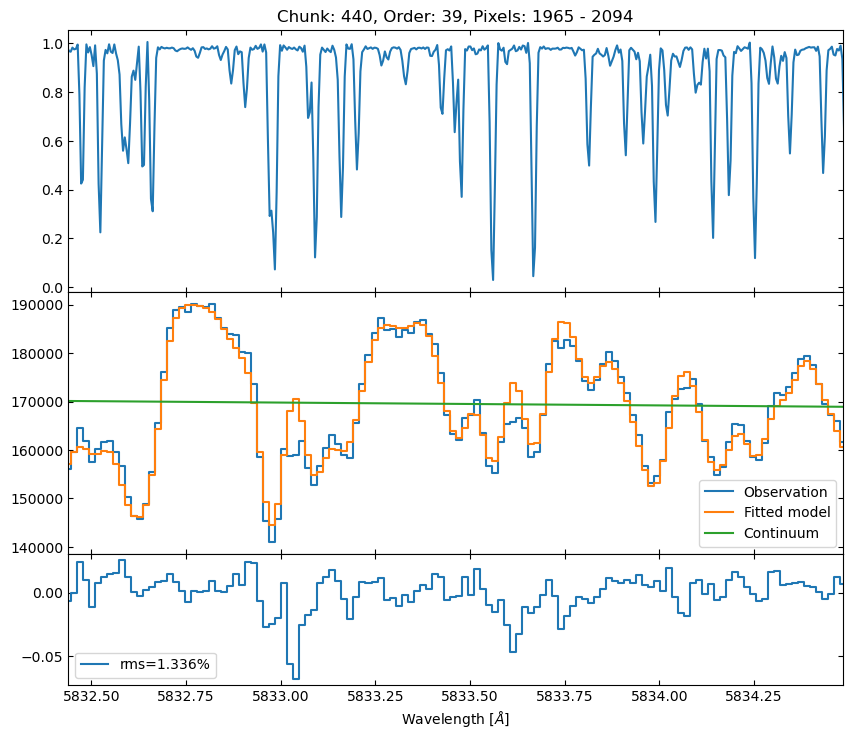

Chunk 450: Wave slope difference = 5.620351e-05 A/pix


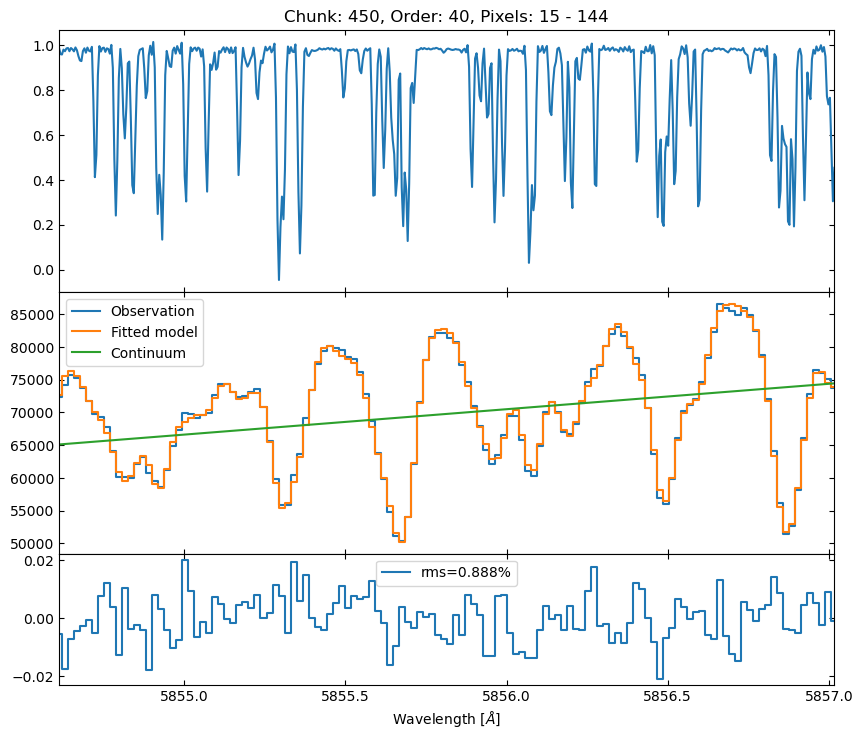

Chunk 460: Wave slope difference = 1.571866e-04 A/pix


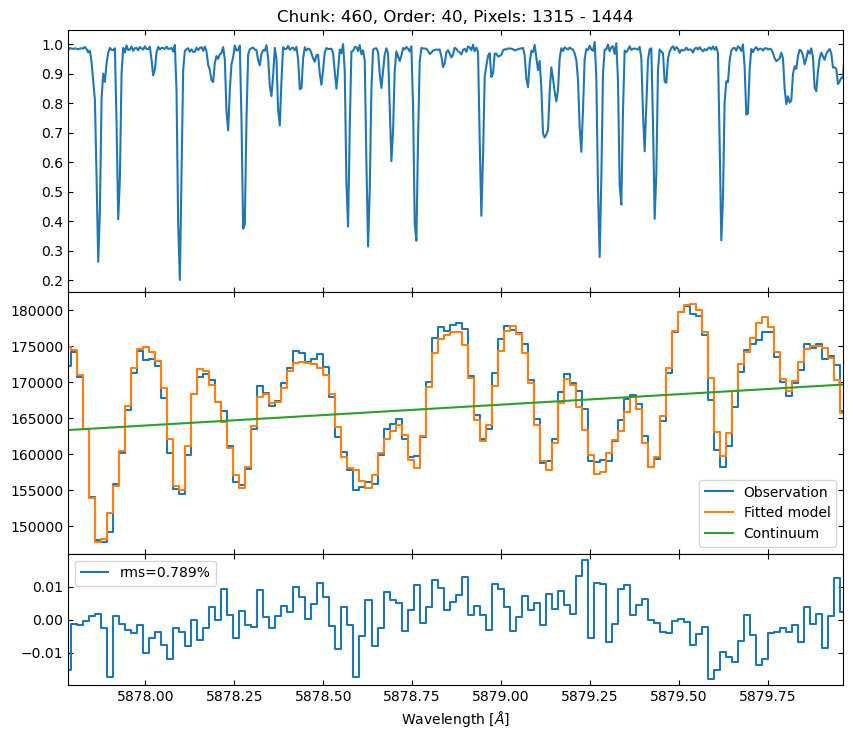

Chunk 470: Wave slope difference = 1.039450e-04 A/pix


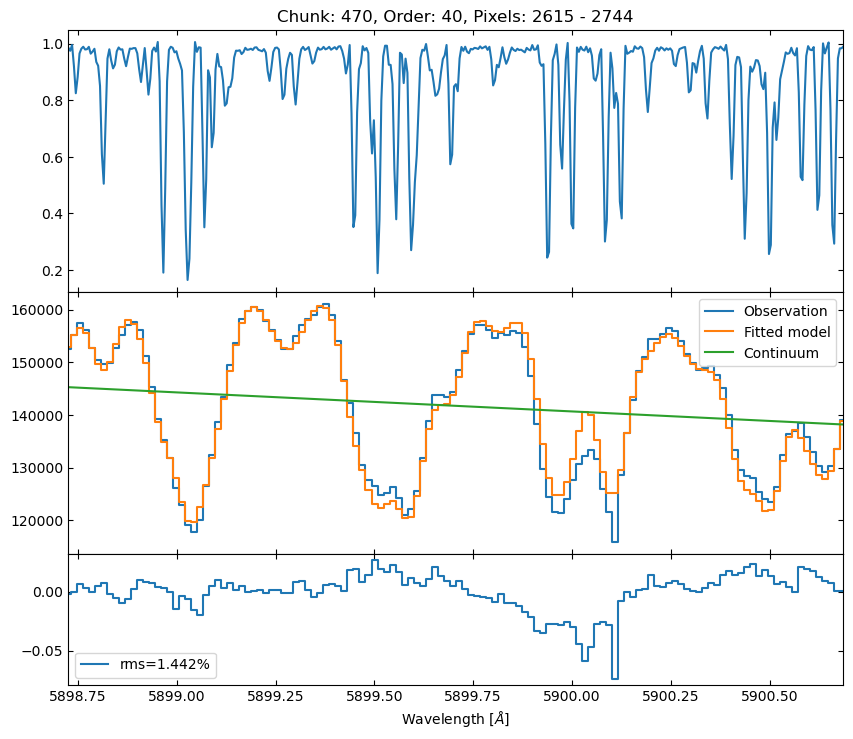

Chunk 480: Wave slope difference = 1.441026e-04 A/pix


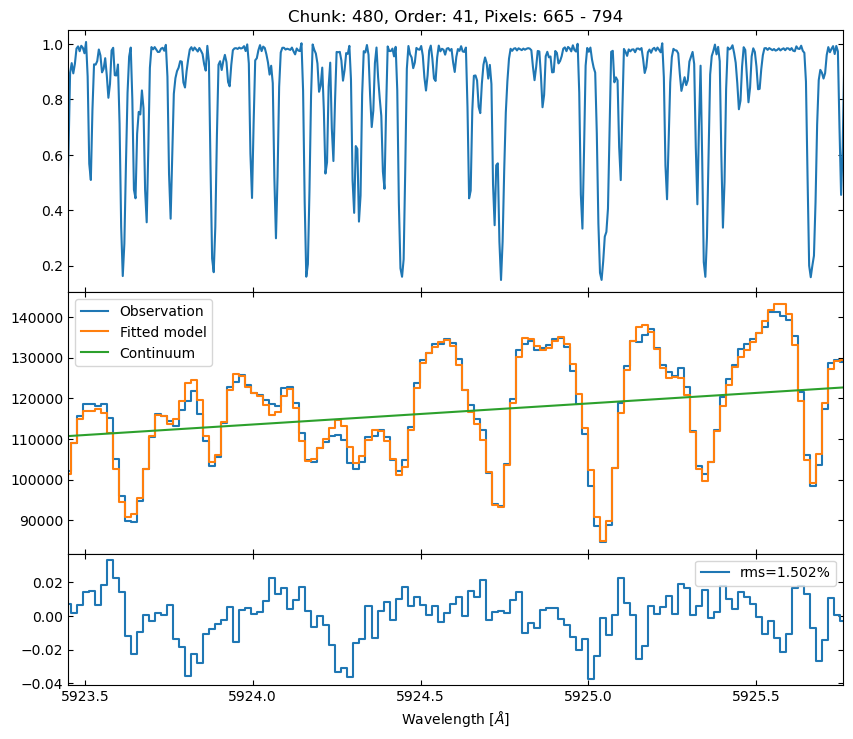

Chunk 490: Wave slope difference = 1.023014e-04 A/pix


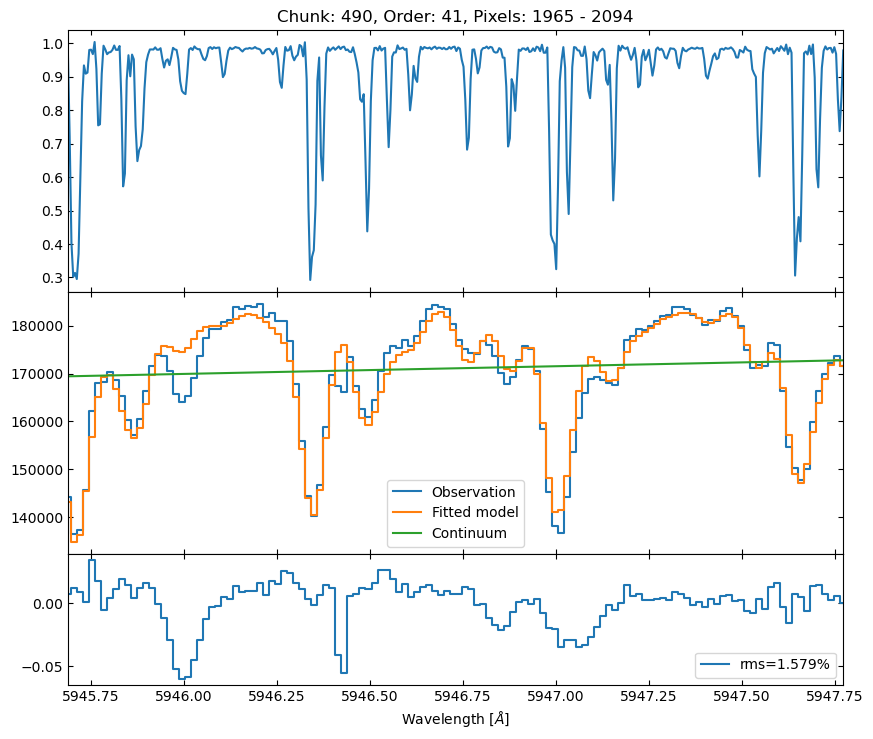

Chunk 500: Wave slope difference = 3.439917e-05 A/pix


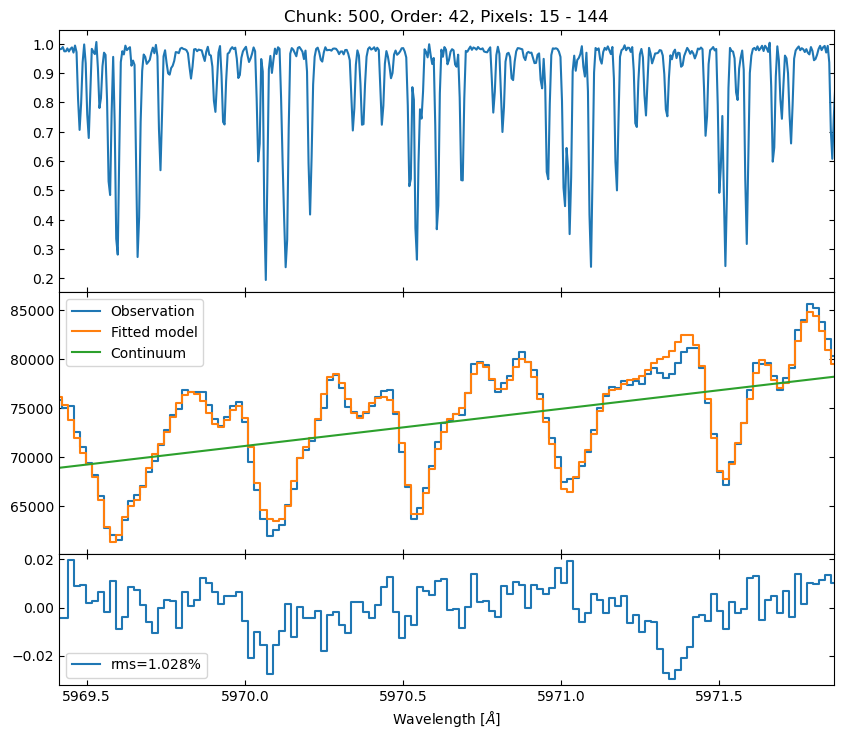

Chunk 510: Wave slope difference = 1.068741e-04 A/pix


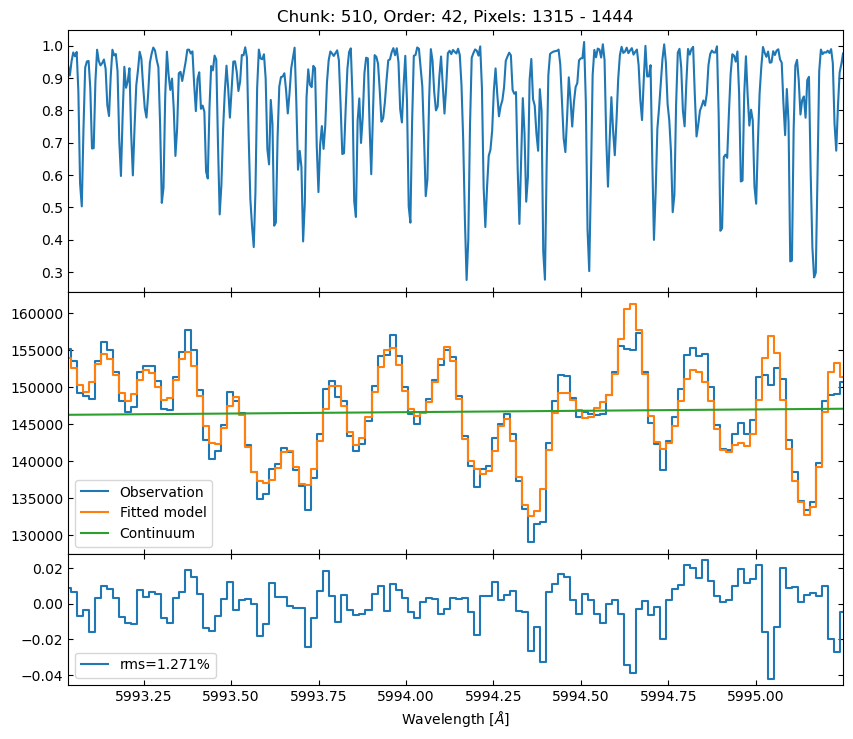

Chunk 520: Wave slope difference = 1.290843e-04 A/pix


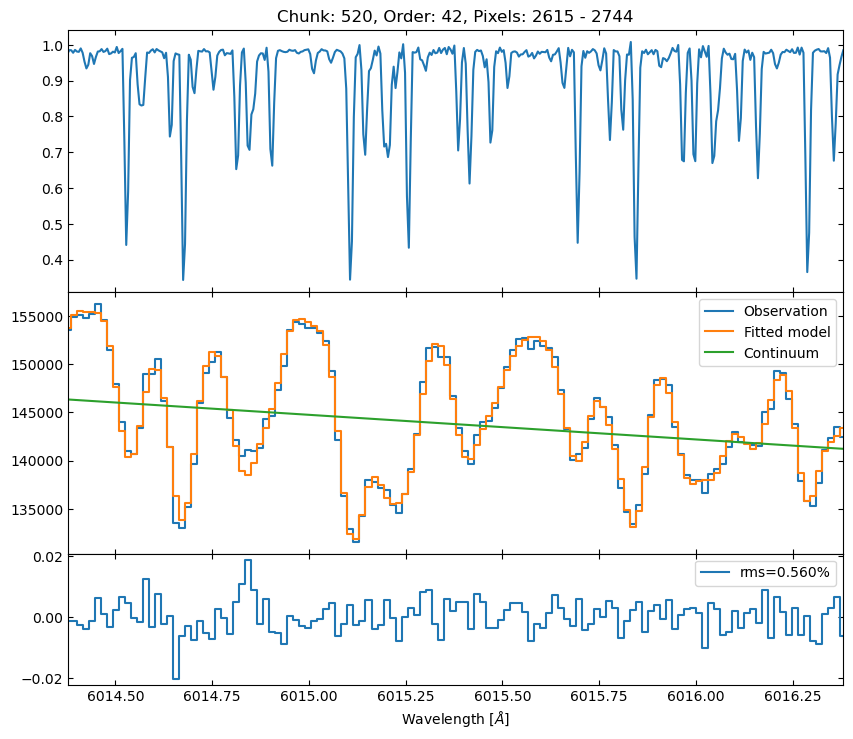

Chunk 530: Wave slope difference = 1.500607e-04 A/pix


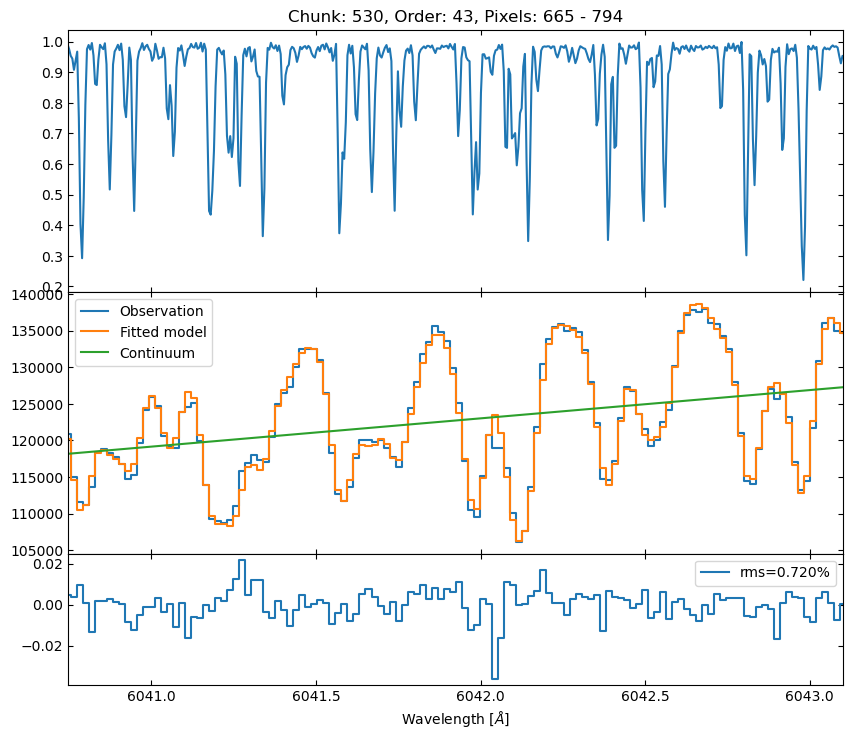

Chunk 540: Wave slope difference = 1.498953e-04 A/pix


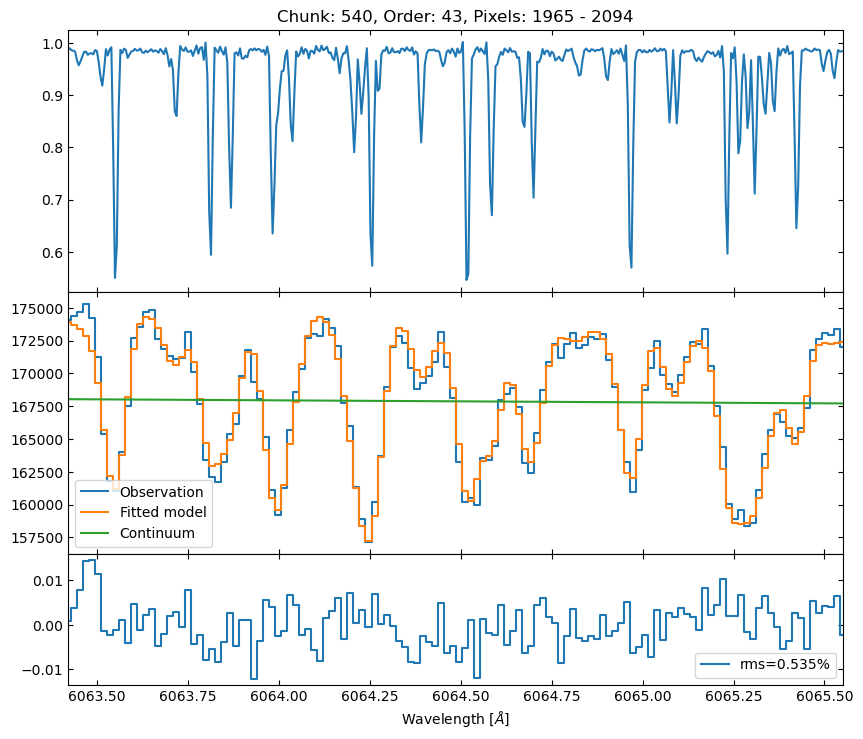

Chunk 550: Wave slope difference = 1.712636e-05 A/pix


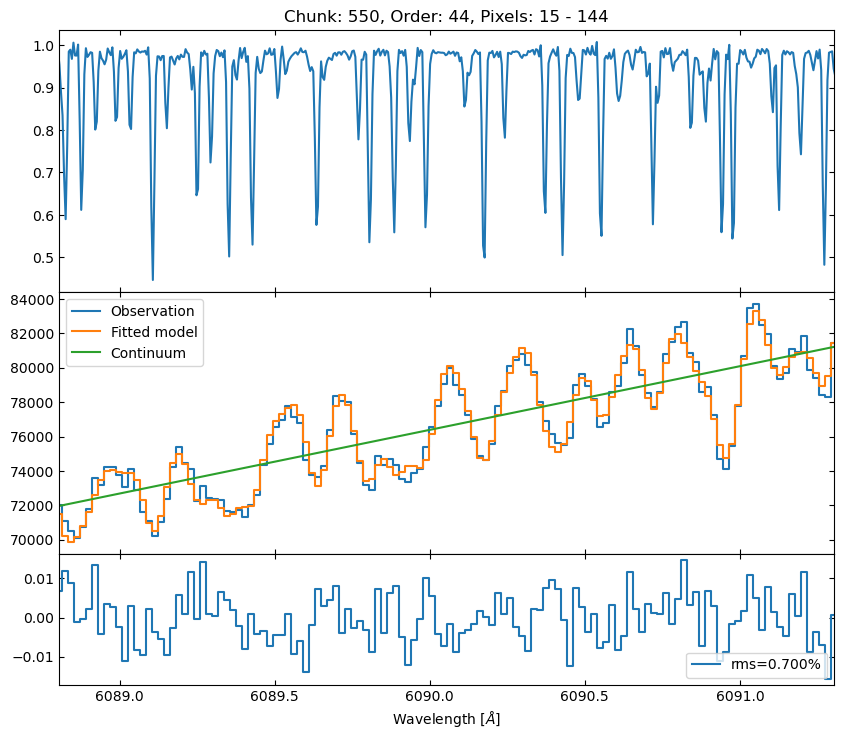

Chunk 560: Wave slope difference = 1.205951e-04 A/pix


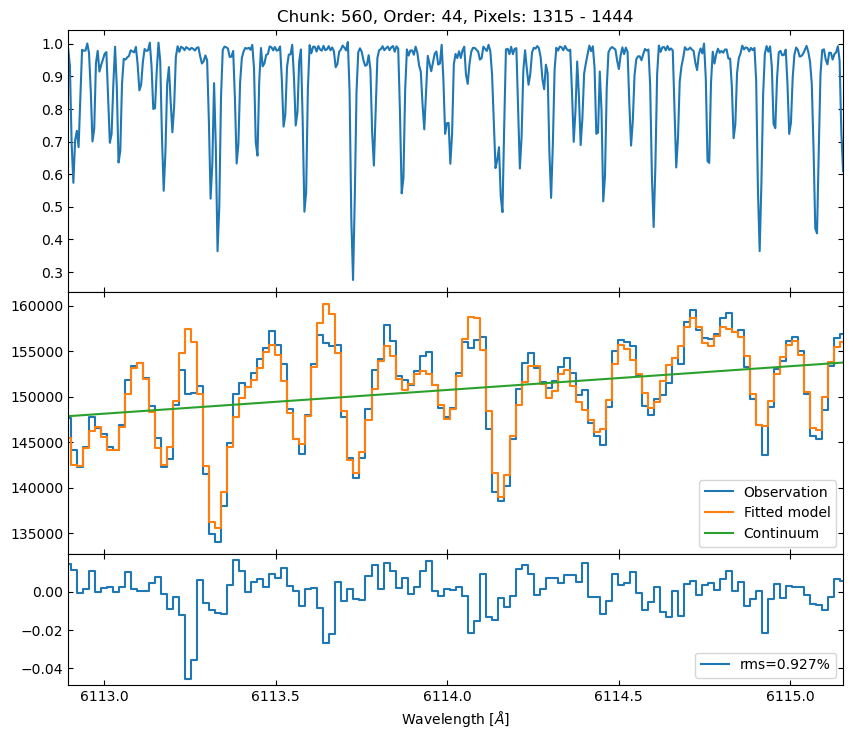

Chunk 570: Wave slope difference = 1.062132e-04 A/pix


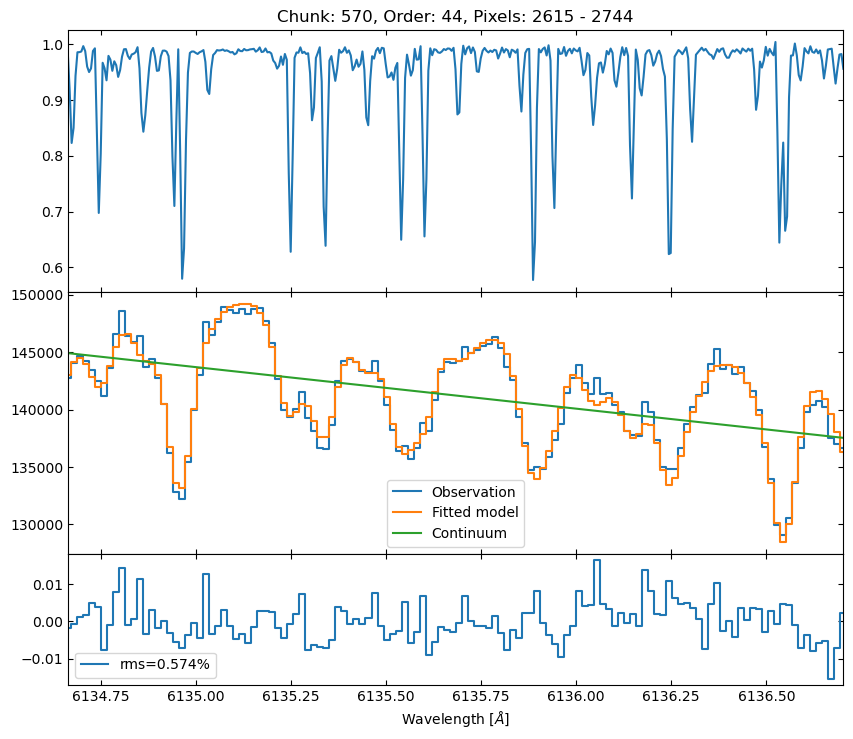

Chunk 580: Wave slope difference = 1.582179e-04 A/pix


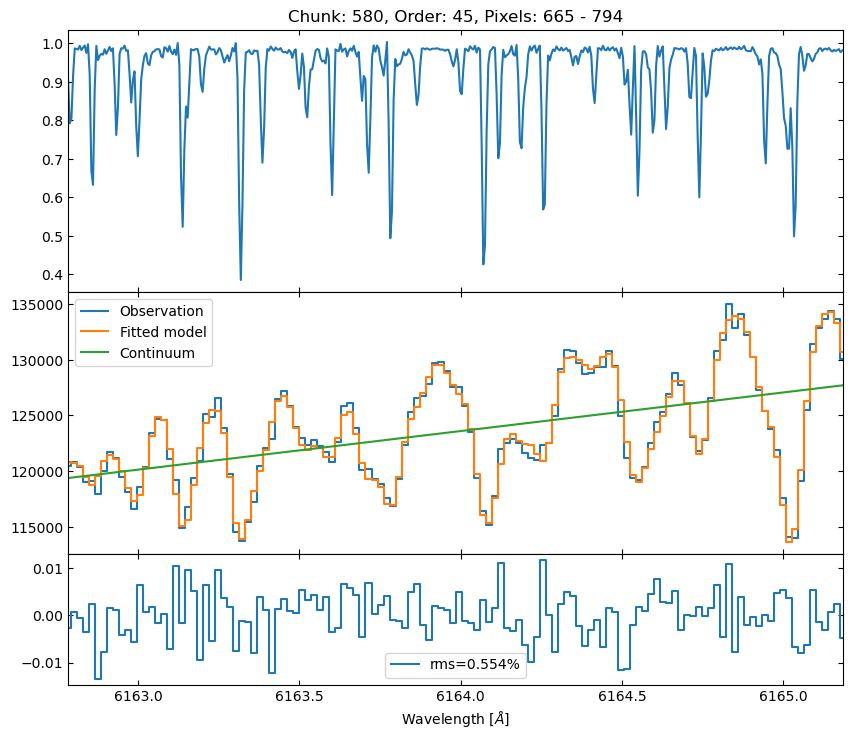

Chunk 590: Wave slope difference = 1.442803e-04 A/pix


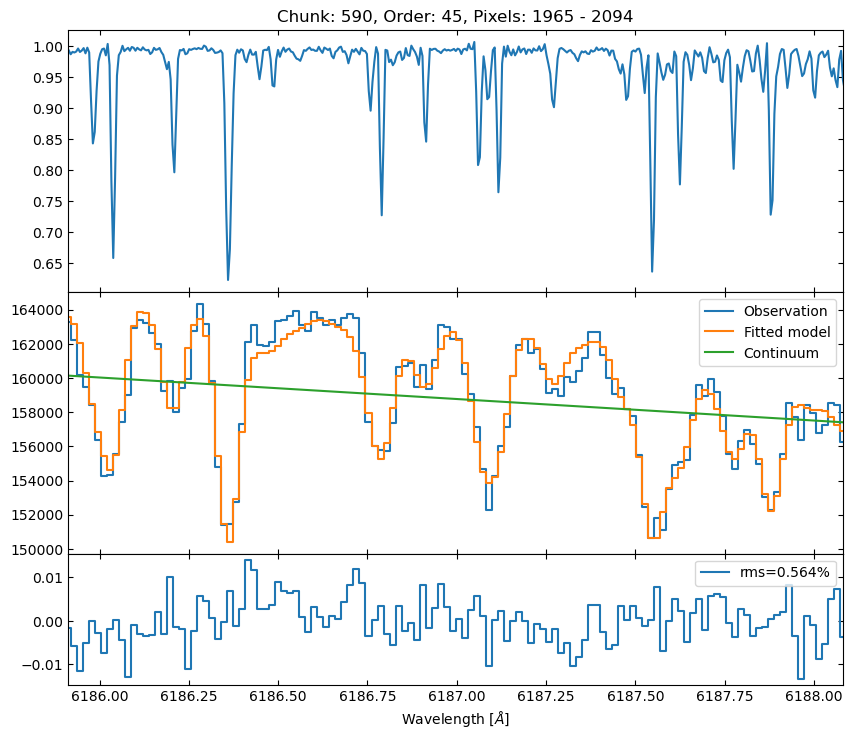

Chunk 600: Wave slope difference = -1.623206e-05 A/pix


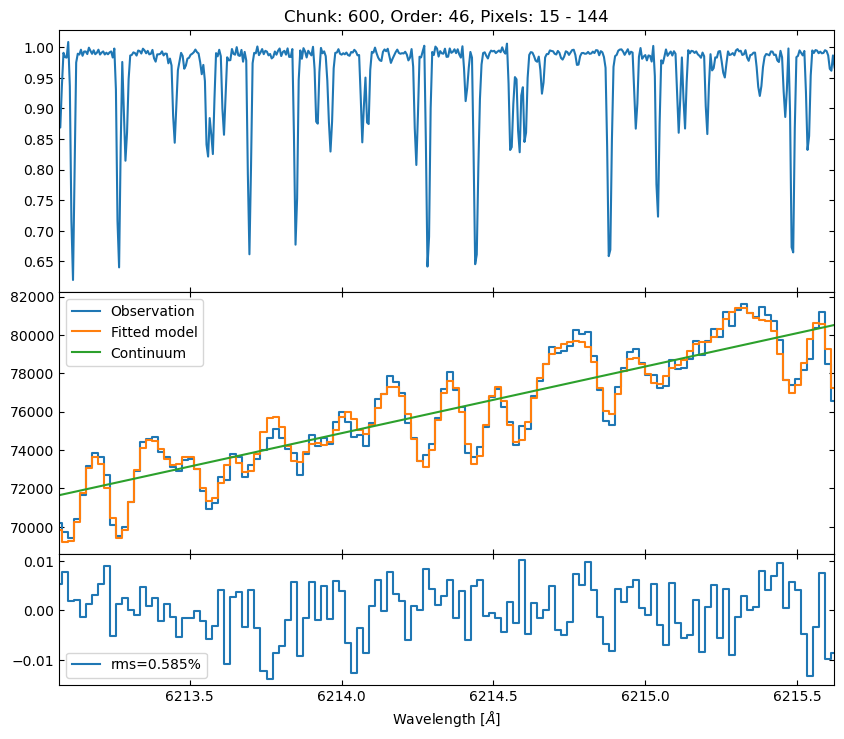

Chunk 610: Wave slope difference = 1.540780e-04 A/pix


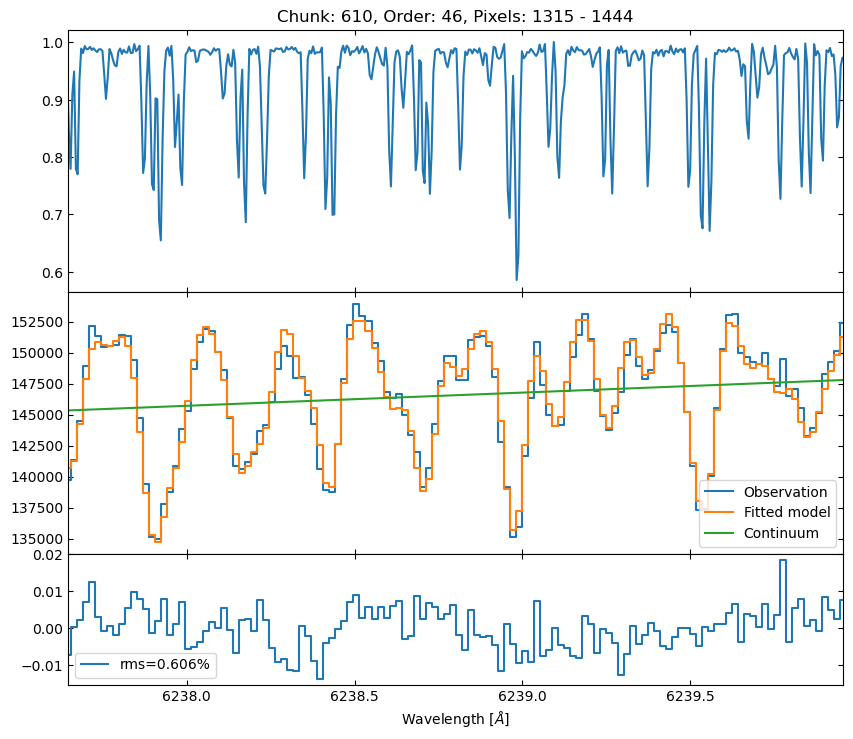

Chunk 620: Wave slope difference = 9.569882e-05 A/pix


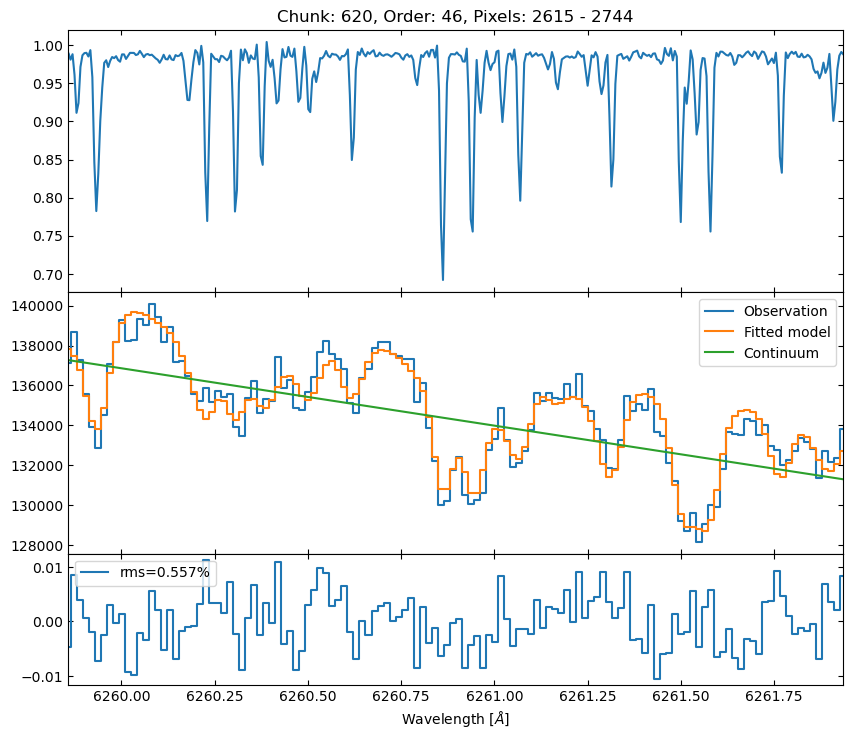

Chunk 630: Wave slope difference = -3.230461e-05 A/pix


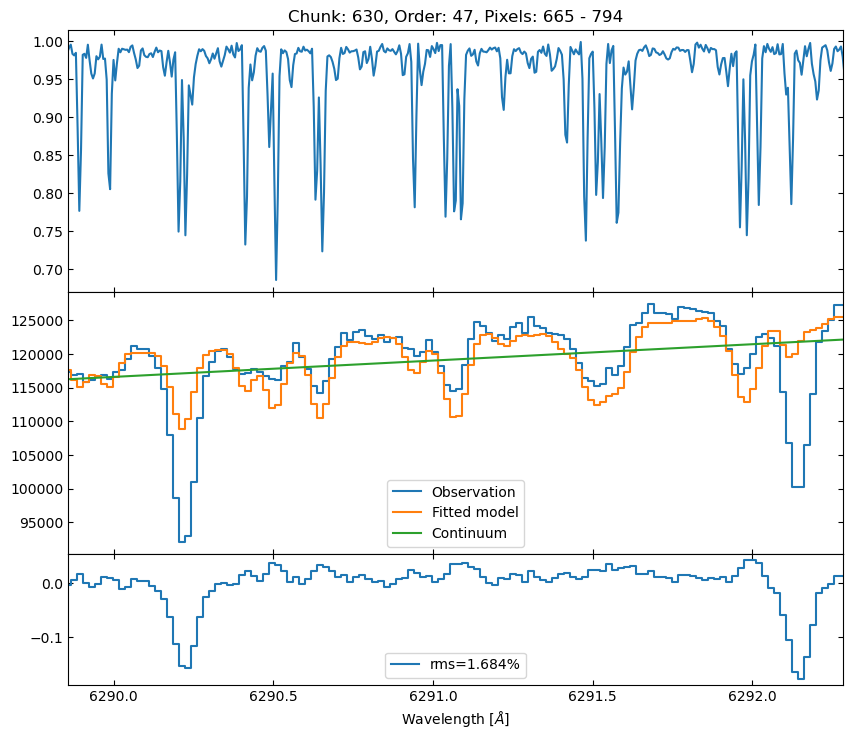

Chunk 640: Wave slope difference = 2.810994e-04 A/pix


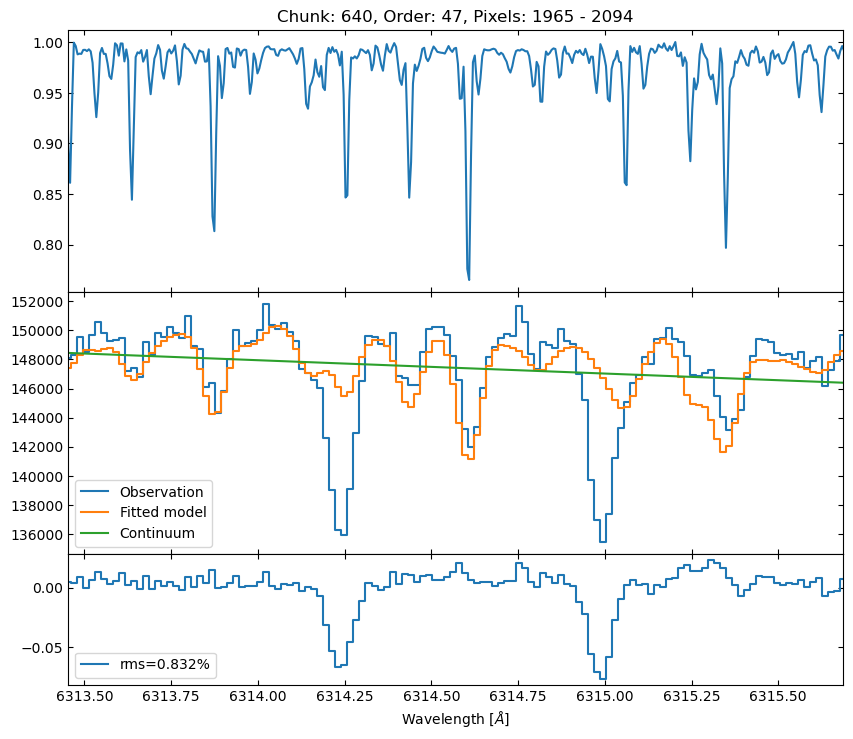

In [40]:
#loop over all chunks and print the wave slope difference and plot
for i in range(len(fit_results_1)):
    #only plot every 10th chunk to save time but skip first 10
    if i < 10 or i % 10 != 0:
        continue
    # Compute wave slope difference
    diff = wave_slopes_model[i] - wave_slopes_data[i]
    print(f'Chunk {i}: Wave slope difference = {diff:.6e} A/pix')
    
    # Plot each chunk (you can choose to plot selectively to save time)
    pyodine.plot_lib.plot_chunkmodel(fit_results_0, chunks, i, template=False, show_plot=True)


And now, for completeness sake, let’s again look at the same chunk as in the beginning - but using the results from RUN 0. You’ll see that the residuals are in fact larger when using the Single-Gaussian LSF:

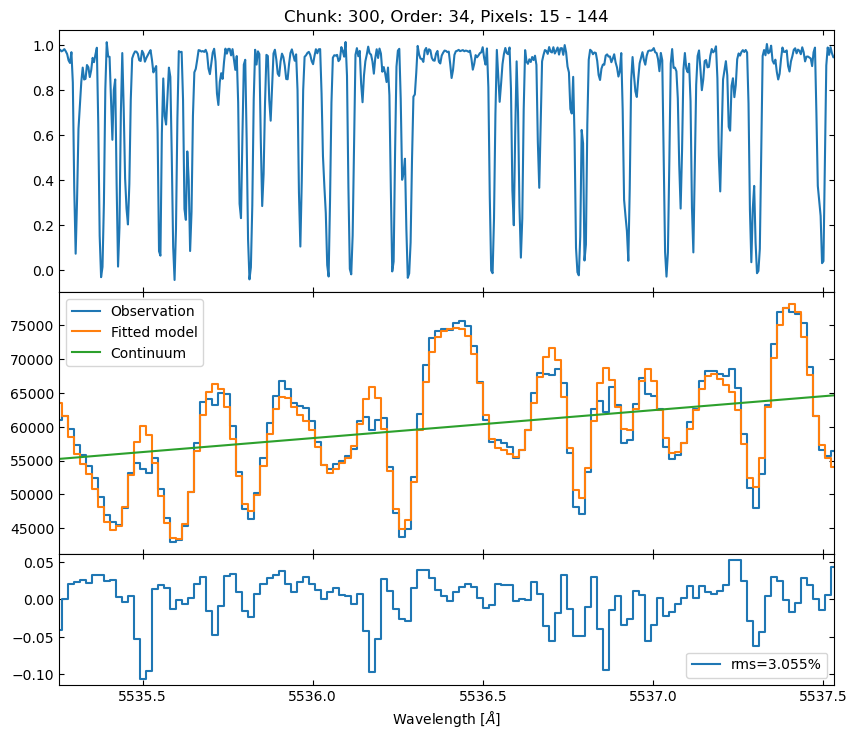

In [41]:
# Chunk index
chunk_ind = 300

pyodine.plot_lib.plot_chunkmodel(fit_results_0, chunks, chunk_ind, template=False, 
                                 show_plot=True)

In [42]:
template = pyodine.template.base.StellarTemplate_Chunked(temp_outname)

print('The deconvolved template object:\n', template)
print('\nThe first chunk of the template:\n', template[0])
from astropy.io import fits

with fits.open(obs_sum_outname) as hdu:
    temp_obs_flux = hdu[0].data[0]      # <- ind 0: normalized flux
    temp_obs_wave = hdu[0].data[2]      # <- ind 2: wavelengths

Loading template from file: /Users/jaklusmeyer/SONG/reduce/0007_sigdra_temp_results_v5_o01_idealnight/obs_temp_highsnr_test.h5
The deconvolved template object:
 <StellarTemplate_Chunked of b'HD185144' (650 chunks, 26 orders)>

The first chunk of the template:
 <Spectrum (1591 pixels, 4990.4918-4993.0598 Å>


The deconvolved template in this form is saved basically as a list of the individual deconvolved chunks, along with some meta-data and information.

We want to compare it to the original stellar template observations that it was deconvolved from, so let’s load the coadded, normalized (non-deconvolved) stellar template:

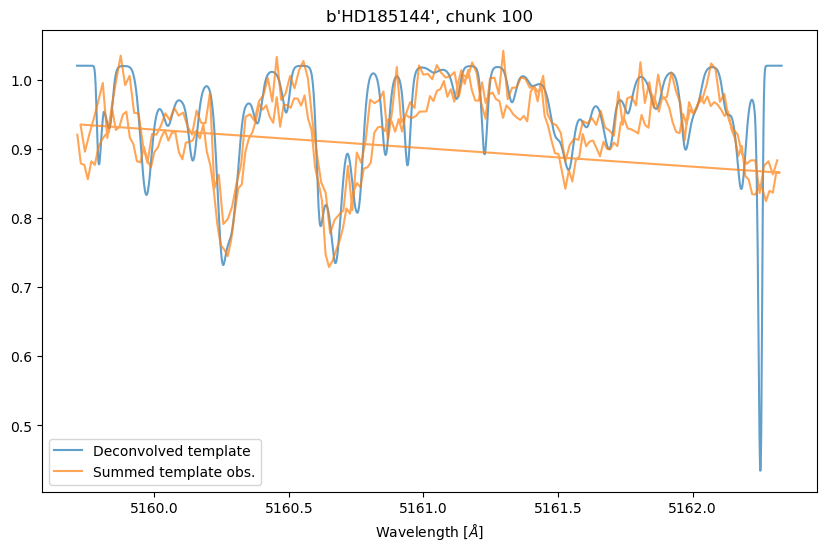

In [43]:
# Chunk index
chunk_ind = 100

# The wavelength range covered by this chunk
wave_range = [template[chunk_ind].wave[0], template[chunk_ind].wave[-1]]

# Get the (order,pixel)-indices of the  summed observation covering this range
ind = np.where(np.logical_and(temp_obs_wave > wave_range[0], 
                              temp_obs_wave < wave_range[1]))

# And plot
fig = plt.figure(figsize=(10,6))
plt.plot(template[chunk_ind].wave, template[chunk_ind].flux, 
         alpha=0.7, label='Deconvolved template')
plt.plot(temp_obs_wave[ind], temp_obs_flux[ind], 
         alpha=0.7, label='Summed template obs.')
plt.legend()
plt.xlabel(r'Wavelength [$\AA$]')
plt.title('{}, chunk {}'.format(template.starname, chunk_ind))
plt.show()